In [40]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="4"

In [41]:
import sys
import os

from instant_aiv.models.NNpp import *
from instant_aiv.models.metrics import *
from instant_aiv.manage.plots import *
from instant_aiv.manage.dataloader import *


# Libraries
import argparse
import numpy as np
import scipy.io
import time
import gc
import pandas as pd
from functools import reduce
import pickle


#Plots
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm


import os
import numpy as np
import jax
from jax import jit, grad, vmap, value_and_grad,jvp

import jax.numpy as jnp
import optax

from typing import Tuple
import time


import h5py
from typing import List, Dict
from pyDOE import lhs
import tqdm
import scipy.integrate as integrate
from sklearn.model_selection import train_test_split
from matplotlib.ticker import FormatStrFormatter


In [42]:
cmap = 'plasma'
num_colors=8
# Create a colormap
cmap = plt.get_cmap(cmap)
colors = [cmap(i) for i in np.linspace(0, 1, num_colors)]
colors=colors[:num_colors//4]+colors[3*num_colors//4:]
print(len(colors))
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['font.size'] = 20

4


# Tunning Parameters

In [ ]:
parser = argparse.ArgumentParser(description='Tunning_parameters')
parser.add_argument('--run_type'   , type=str  , default='Real_M1')
parser.add_argument('--mode'       , type=str  , default='PINN')
parser.add_argument('--Run_MODE'   , type=str  , default='Train')

parser.add_argument('--num_layer'  , type=int  , default=8)
parser.add_argument('--width_layer', type=int  , default=200)
parser.add_argument('--train_ratio' , type=float, default=0.5)
parser.add_argument('--Weight_Norm'    , type=int , default=1)
parser.add_argument('--Mod_MLP'    , type=int , default=0)
parser.add_argument('--Use_ResNet'    , type=int , default=1)
parser.add_argument('--Adaptive'    , type=int , default=1)
parser.add_argument('--Light'    , type=int , default=0)
parser.add_argument('--offset_k' , type=float  , default=1.0)

parser.add_argument('--batch_size' , type=int  , default=10000)
parser.add_argument('--num_gsteps' , type=int  , default=400*(10**3))
parser.add_argument('--Name' , type=str  , default='M1_Smooth')
parser.add_argument('--normalization' , type=str  , default='chebyshev5')
parser.add_argument('--Equal_Batch' , type=bool  , default=True)
parser.add_argument('--optimizer' , type=str  , default='AdamW')

parser.add_argument('--use_RBA'    , type=int , default=1)
parser.add_argument('--k_samp' , type=float  , default=2.0)
parser.add_argument('--c_samp' , type=float  , default=0.5)
parser.add_argument('--lr_lambdas_0' , type=float  , default=0.1)
parser.add_argument('--gamma' , type=float  , default=0.999)


parser.add_argument('--use_mass'    , type=int , default=1)



args, unknown = parser.parse_known_args()
for arg, value in vars(args).items():
    print(f'{arg}: {value}')

run_type: Real_M1
mode: PINN
Run_MODE: Train
num_layer: 8
width_layer: 200
train_ratio: 0.5
Weight_Norm: 1
Mod_MLP: 0
Use_ResNet: 1
Adaptive: 1
Light: 0
mode_POD: 5
offset_k: 1.0
batch_size: 10000
num_gsteps: 400000
Name: M1_Smooth
normalization: chebyshev5
Equal_Batch: True
optimizer: AdamW
use_RBA: 1
k_samp: 2.0
c_samp: 0.5
lr_lambdas_0: 0.1
gamma: 0.999
use_mass: 1


In [44]:
Run_type = args.run_type
Mode=args.mode
#ResNet Architecures
Use_ResNet=args.Use_ResNet 
Adaptive=args.Adaptive 
Light=args.Light 
num_layer=args.num_layer
use_mass=args.use_mass 
offset_k=args.offset_k 
args.Name=args.Name+str(offset_k)

if Use_ResNet:
    num_layer=int((num_layer+2)/2)

width_layer=args.width_layer
layers={
    'P' :[4]  + num_layer*[3*width_layer//4] + [1],
    'c' :[4]  + num_layer*[width_layer] + [1],
    'c_std' :[4]  + num_layer*[width_layer//3] + [1],
    'k' :[4]  + num_layer*[3*width_layer//4] + [1],
    'D' :[4]  + num_layer*[3*width_layer//4] + [1],
}
layers_ref=np.copy(layers['P'])
layers_1=np.copy(layers['P'])

train_ratio=args.train_ratio

Details=f'{args.Name}-Train:{train_ratio}_mass:{args.use_mass}'

Run_MODE=args.Run_MODE

print('Model Architecture:')
print(layers)

activation = 'sin'
initialization = 'xavier'
normalization  = args.normalization
loss_metric ='L2'
Weight_Norm =args.Weight_Norm#Weight Normalization
use_RBA=args.use_RBA
Mod_MLP=args.Mod_MLP  #Modified MLP
normalize_outputs=False
init_zero=True
Adaptive_AF=False

#Optimization
num_gsteps  = args.num_gsteps
batch_size = args.batch_size

#learning 
lam_min=0.0
lr0=2*10**(-3)
lrf=5*10**(-5)
lr_lambdas_0=args.lr_lambdas_0
gamma=args.gamma
max_lambda=lr_lambdas_0/(1-gamma)
print(f'Max lambdas will be:{max_lambda}')
T_e=num_gsteps
decay_rate=0.9
decay_step=0
seed_np=1234
key = jax.random.PRNGKey(seed_np)
key, subkey = jax.random.split(key)

#Scaling factor
p_scale=1

#Sample Points
N_r=1000000
N_d=1000000
# Model
dataset_name = f'{Details}'


Model Architecture:
{'P': [4, 150, 150, 150, 150, 150, 1], 'c': [4, 200, 200, 200, 200, 200, 1], 'c_std': [4, 66, 66, 66, 66, 66, 1], 'k': [4, 150, 150, 150, 150, 150, 1], 'D': [4, 150, 150, 150, 150, 150, 1]}
Max lambdas will be:99.99999999999991


In [45]:
project_root = find_package_directory() # if error please define the root package directly (e.g. project_root='/users/.../' )
data_path=project_root+'/Data/Real_Data/M1_concentration.mat'
path_vels=project_root+"/Data/Real_Data/Front_Tracking.mat"

save_path=project_root+f'/Results/{Run_type}/'
big_data_path=save_path
print(f'Analizing:{data_path}')
print(f'Details:{Details}')
print(f'dataset_name:{dataset_name}')


Analizing:/users/jdtoscan/Documents/Papers/Instant_AIV//Data/Real_Data/M1_concentration.mat
Details:M1_Smooth1.0-Train:0.5_mass:1
dataset_name:M1_Smooth1.0-Train:0.5_mass:1


In [46]:
use_RBA=int(use_RBA)
print(f'Using RBA:{use_RBA}')

Using RBA:1


## Settings


In [47]:
# Fetching activation function
activation_fn = ACTIVATION_FUNCTIONS.get(activation.lower())

# Fetching normalization functions and metrics
norm_settings = NORMALIZATION_FUNCTIONS.get(normalization.lower())
norm_fn = norm_settings['fn']
Norm_metric1 = norm_settings['metric1']
Norm_metric2 = norm_settings['metric2']

# Fetching error function
Error_fn = ERROR_FUNCTIONS.get(loss_metric.lower())

#Adjust layer structure to account for Chebyshev Feature Embbeding
for key in layers.keys():
    embed_size=layers[key][1]
    input_dim=layers[key][0]*5
    output_dim=layers[key][-1]
    layers[key]=[input_dim]+(num_layer)*[embed_size]+ [output_dim]
print(f'New architecture:{layers}')

New architecture:{'P': [20, 150, 150, 150, 150, 150, 1], 'c': [20, 200, 200, 200, 200, 200, 1], 'c_std': [20, 66, 66, 66, 66, 66, 1], 'k': [20, 150, 150, 150, 150, 150, 1], 'D': [20, 150, 150, 150, 150, 150, 1]}


# Load Model K

In [48]:
np.random.seed(seed_np)
params= init_params_dict(layers, initialization,Use_ResNet)

# Model selection
pinn_fn =select_model(WN=Weight_Norm,Use_ResNet=Use_ResNet,Adaptive=Adaptive,Light=Light)
print(f'The model will be: {pinn_fn}')

You selected: Network mlp with degree(if KAN) 5, initialization xavier,Use_ResNet 1
The model will be: <function WN_ResNet_adaptive at 0x7fd9a1f62840>


In [49]:
save_file_details=project_root+'/Results/Initialization_Details_Real.pkl'

with open(save_file_details, 'rb') as f:
    file_details_loaded = pickle.load(f)
print(file_details_loaded.keys())

dict_keys(['path', 'name', 'layers', 'lb_all', 'ub_all', 'off_set', 'k_char0', 'offset_k', 'p_scale', 'M1', 'M2'])


In [50]:
M1_all=file_details_loaded['M1']
M2_all=file_details_loaded['M2']
lb_all=file_details_loaded['lb_all']
ub_all=file_details_loaded['ub_all']
off_set=file_details_loaded['off_set']
layers_k=file_details_loaded['layers']
offset_k=file_details_loaded['offset_k']
k_params_file=project_root+file_details_loaded['path']
dataset_k=file_details_loaded['name']
p_scale=file_details_loaded['p_scale']
Norm_fn={}
Norm_fn['c']=norm_fn
Norm_fn['P']=norm_fn

Norm_fn['k']=Encode_Chebysev_5


k_char0=file_details_loaded['k_char0']
P_char=3.938900070900201
loaded_params_k = load_params_dict(k_params_file, dataset_k, layers_k, initialization,type='Final',Use_ResNet=Use_ResNet) 
print('Parameters loaded from file')
params['k']=loaded_params_k['k']
layers['k']=layers_k['k']
params['c']=loaded_params_k['c']
layers['c']=layers_k['c']
params['P']=loaded_params_k['P']
layers['P']=layers_k['P']
params['c_std']=loaded_params_k['c_std']
layers['c_std']=layers_k['c_std']

100%|██████████| 1/1 [00:00<00:00, 28.29it/s]


Initializing:mlp parameters.


100%|██████████| 1/1 [00:00<00:00, 26.48it/s]


Initializing:mlp parameters.


100%|██████████| 1/1 [00:00<00:00, 43.61it/s]


Initializing:mlp parameters.


100%|██████████| 1/1 [00:00<00:00, 49.43it/s]


Initializing:mlp parameters.


100%|██████████| 1/1 [00:00<00:00, 28.89it/s]

Initializing:mlp parameters.
Parameters loaded from file


In [51]:
optimizer={}
opt_state={}
for key in layers.keys():
    print(f'Initializing Optimizer for:{key}')
    optimizer[key],decay_step= initialize_optimizer(lr0, decay_rate, lrf, decay_step, num_gsteps,optimizer_type=args.optimizer)
    opt_state[key]=optimizer[key].init(params[key])
M1= Norm_metric1
M2= Norm_metric2
print('Norm metrics:',M1,M2)


Initializing Optimizer for:P
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552


Initializing Optimizer for:c
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Initializing Optimizer for:c_std
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Initializing Optimizer for:k
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Initializing Optimizer for:D
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Norm metrics: <function <lambda> at 0x7fd9a7524860> <function <lambda> at 0x7fd9a7524900>


## Create Folders

In [52]:
subdirs = ["General","Imgs", "Big_Data", "Data", "Flow_rate", "Errors",'System_video','System_video_abs','System_video_scaled','System_video_crop','PDF','PDF_filtered']
paths = create_and_return_directories(save_path, dataset_name, subdirs)
print(dataset_name)
result_path = paths["General"]
images_path = paths["Imgs"]
big_path = paths["Big_Data"]
Video_path = paths["Flow_rate"]
Pdf_path = paths["PDF"]
System_video_path = paths["System_video"]
System_video_abs_path = paths["System_video_abs"]
System_video_crop_path = paths["System_video_crop"]
System_video_scaled_path = paths["System_video_scaled"]
errors_path = paths["Errors"]


The general path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/General/
The imgs path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/Imgs/
The big data path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/Big_Data/
The data path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/Data/
The flow rate path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/Flow_rate/
The errors path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/Errors/
The system video path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/System_video/
The system video abs path is: /users/jdtoscan/Documents/Papers/Instant_AIV//Results/Real_M1/M1_Smooth1.0-Train:0.5_mass:1/System_video_abs/
The 

# Non-Dimensional values

In [53]:
k1=1*10**(-12)#mm2
D1=3.8*10**(-10)#mm2/s
k2=1*10**(-16)
D2=2.3*10**(-10)
nu_e=7*10**(-7)
rho=993
mu=0.6913e-3
h=0.00034 #Maximum length by 100
L_char=h
U_char=0.5/5#mm/min
D_char=2.4e-10#m2/s
U_char=U_char*(1/1000)*(1/60)#m/s
T_char=L_char/U_char
C_char=1
Pef=U_char*L_char/D_char
mms=10**6
L_char=L_char
k_char=k_char0
P_char=U_char*L_char*mu/k_char
print(T_char,L_char,U_char,C_char,D_char)
print(Pef)
print(k_char)
print(P_char)

T_SI=1
L_SI=1000
D_SI=1#10**6
U_SI=1#1000
P_SI=1
K_SI=1#10**6
SI_fact_steady=np.array([1/T_SI,1/L_SI,1/L_SI,1/L_SI,1/D_SI,1/U_SI,1/U_SI,1/U_SI,1/P_SI,1/K_SI])
SI_fact=np.array([1/T_SI,1/L_SI,1/L_SI,1/L_SI,1])
non_dim_fact_steady=np.array([1/T_char,1/L_char,1/L_char,1/L_char,1/D_char,1/U_char,1/U_char,1/U_char,1/P_char,1/k_char])
non_dim_fact=np.array([1/T_char,1/L_char,1/L_char,1/L_char,1])
print(non_dim_fact)

204.00000000000003 0.00034 1.6666666666666667e-06 1 2.4e-10
2.361111111111111
1e-14
39.17366666666667
[4.90196078e-03 2.94117647e+03 2.94117647e+03 2.94117647e+03
 1.00000000e+00]


## Load Data


In [54]:
Data = scipy.io.loadmat(data_path)
X_nnf = Data['Data']
#Arrays
T_star=X_nnf[:,:,0]
X_star=X_nnf[:,:,1]
Y_star=X_nnf[:,:,2]
Z_star=X_nnf[:,:,3]
C_star=X_nnf[:,:,4]
Data = scipy.io.loadmat(data_path)
X_nnf = Data['Data']
Xnn=np.concatenate(X_nnf)
Data['Data_labels']
X_data_raw=Xnn
X_res=Xnn[:,0:4]
Pef=Xnn[0,6]
Re=Xnn[0,7]
Da=Xnn[0,8]
print(Pef,Re,Da)

2.5180253917871505 0.0008095238095238096 8.650519031141868e-06


In [55]:
T_star=X_nnf[:,:,0]
X_star=X_nnf[:,:,1]
Y_star=X_nnf[:,:,2]
Z_star=X_nnf[:,:,3]
C_star=X_nnf[:,:,4]

## Front Tracking

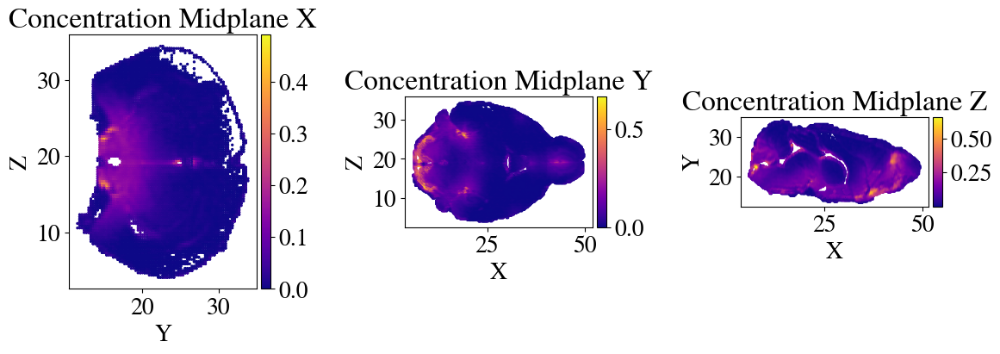

In [56]:
frame=30
X_plot = X_nnf[30]
t,x, y, z, c = X_plot[:,0], X_plot[:,1], X_plot[:,2], X_plot[:,3], X_plot[:,4]
# Calculate midplane values
x_midplane = np.median(x)
y_midplane = np.median(y)
z_midplane = np.median(z)

tolerance = 0.5  # Adjust based on your dataset's spread

# Define filters for each midplane
x_midplane_filter = np.abs(x - x_midplane) <= tolerance
y_midplane_filter = np.abs(y - y_midplane) <= tolerance
z_midplane_filter = np.abs(z - z_midplane) <= tolerance

# Prepare for visualization

# Variables for plotting
variables = [c]  # Use the scalar field for coloring
variable_names = ['Concentration']

# Visualization
for i, var in enumerate(variables):
    fig = plt.figure(figsize=(12, 8))  # Adjust size as needed

    for j in range(3):
        ax = fig.add_subplot(1, 3, j + 1)
        if j == 0:
            filter_mask = x_midplane_filter
            scatter_x, scatter_y = y[filter_mask], z[filter_mask]
            xlabel, ylabel = 'Y', 'Z'
        elif j == 1:
            filter_mask = y_midplane_filter
            scatter_x, scatter_y = x[filter_mask], z[filter_mask]
            xlabel, ylabel = 'X', 'Z'
        else:  # j == 2
            filter_mask = z_midplane_filter
            scatter_x, scatter_y = x[filter_mask], y[filter_mask]
            xlabel, ylabel = 'X', 'Y'

        # Use the scalar field for coloring
        scatter = ax.scatter(scatter_x, scatter_y, c=var[filter_mask], cmap=cmap, s=2)
        ax.set_title(f'{variable_names[i]} Midplane {["X", "Y", "Z"][j]}')
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.axis('equal')
        ax.axis('on')  # Change to 'off' if you prefer no axis

        # Adding a colorbar to each subplot
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(scatter, cax=cax)

plt.tight_layout()
plt.show()


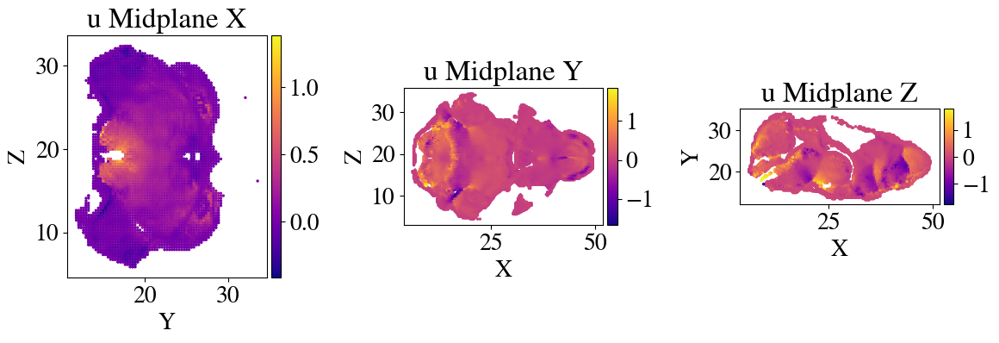

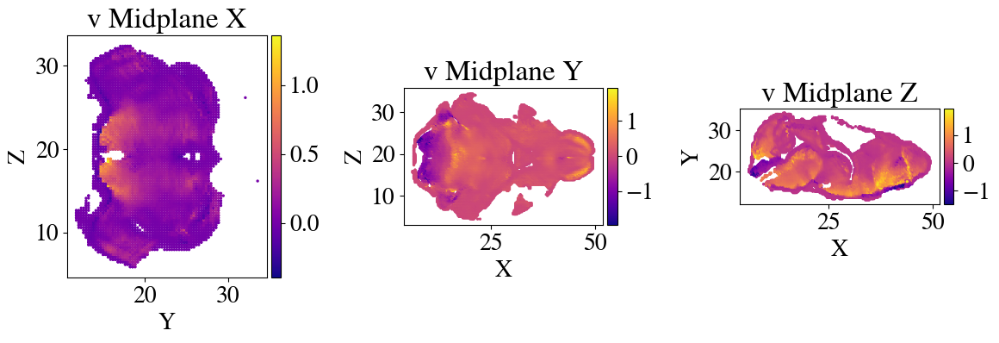

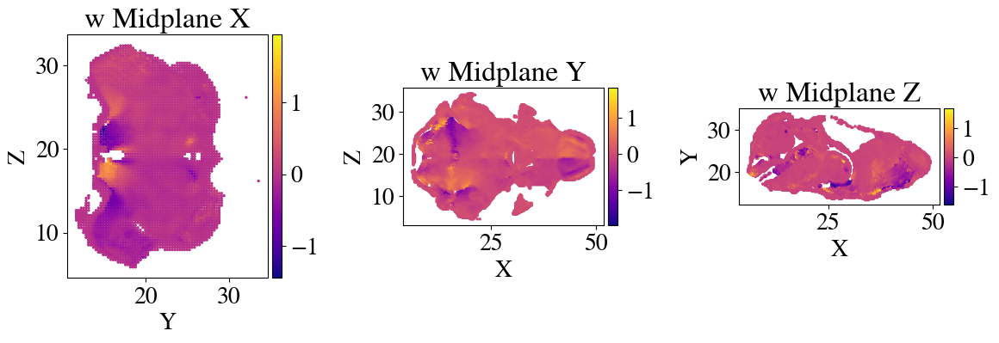

In [57]:
front_track_raw=scipy.io.loadmat(path_vels)
X_val=front_track_raw['mat_v']
fact_vel=(1/60)*(1/1000)*(1/U_char)
fact_L=(1/1000)*(1/L_char)
nond_fact=np.array([fact_L,fact_L,fact_L,fact_vel,fact_vel,fact_vel])
X_val=X_val*nond_fact
X_init_clean = X_val[~np.isnan(X_val).any(axis=1)]
X_init_clean=np.hstack((X_init_clean[:,0:1]*0+10,X_init_clean))
# Assuming X_val is loaded and contains [x, y, z, u, v, w] as columns
x, y, z, u, v, w = [X_val[:, i] for i in range(6)]

# Calculate global min and max for velocity components for normalization
global_min = np.min(X_val[:, 3:], axis=0)
global_max = np.max(X_val[:, 3:], axis=0)

# Prepare for visualization
# Calculate midplane values
x_midplane = np.median(x)
y_midplane = np.median(y)
z_midplane = np.median(z)

tolerance = 0.5  # Adjust based on your dataset's spread

# Define filters for each midplane
x_midplane_filter = np.abs(x - x_midplane) <= tolerance
y_midplane_filter = np.abs(y - y_midplane) <= tolerance
z_midplane_filter = np.abs(z - z_midplane) <= tolerance

# Variables for plotting
variables = [u, v, w]  # Adjust if you're interested in other variables
variable_names = ['u', 'v', 'w']

# Visualization
for i, var in enumerate(variables):
    fig = plt.figure(figsize=(12, 8))  # Adjust size as needed

    for j in range(3):
        ax = fig.add_subplot(1, 3, j + 1)
        if j == 0:
            filter_mask = x_midplane_filter
            scatter_x, scatter_y = y[filter_mask], z[filter_mask]
            xlabel, ylabel = 'Y', 'Z'
        elif j == 1:
            filter_mask = y_midplane_filter
            scatter_x, scatter_y = x[filter_mask], z[filter_mask]
            xlabel, ylabel = 'X', 'Z'
        else:  # j == 2
            filter_mask = z_midplane_filter
            scatter_x, scatter_y = x[filter_mask], y[filter_mask]
            xlabel, ylabel = 'X', 'Y'

        # Normalize color based on global min and max of the specific variable
        vmin, vmax = global_min[i], global_max[i]
        scatter = ax.scatter(scatter_x, scatter_y, c=var[filter_mask], cmap=cmap, s=2)#, vmin=vmin, vmax=vmax)
        ax.set_title(f'{variable_names[i]} Midplane {["X", "Y", "Z"][j]}')
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.axis('equal')
        ax.axis('on')  # Change to 'off' if you prefer no axis

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(scatter, cax=cax)

    plt.tight_layout()
    plt.show()


## Filter based on gradients

In [58]:
sigma_0=0.01
Pe=Pef

In [59]:
def get_sytem_terms(params):
    # Neural Network
    fn={
        'c' :lambda x: pinn_fn(params['c'], x, M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'c_std' :lambda x: pinn_fn(params['c_std'], x, M1_all['c'], M2_all['c'],activation_fn,norm_fn),
    }
    #Pretrained Models
    #New Models
    c= lambda x: fn['c'](x)[0]
    c_std=lambda x: 10*jax.nn.sigmoid(fn['c_std'](x)[0])+sigma_0
   # derivatives
    def derivative_fn(f, x, idx):
        """Computes df/dx[idx] using forward mode AD."""
        perturbation = jnp.zeros_like(x)
        perturbation = perturbation.at[idx].set(1.0)
        primals, tangents = jvp(f, (x,), (perturbation,))
        return tangents


    c_t = lambda x: derivative_fn(c, x, 0)
    c_x = lambda x: derivative_fn(c, x, 1)
    c_y = lambda x: derivative_fn(c, x, 2)
    c_z = lambda x: derivative_fn(c, x, 3)
    c_xx = lambda x: derivative_fn(c_x, x, 1)
    c_yy = lambda x: derivative_fn(c_y, x, 2)
    c_zz = lambda x: derivative_fn(c_z, x, 3)

    # equations

    d_t = lambda x: c_t(x)- (1/Pe)*(c_xx(x) + c_yy(x) + c_zz(x))
    a_t = lambda x: c_x(x) 
    b_t = lambda x: c_y(x) 
    e_t = lambda x: c_z(x)  
    return d_t,a_t,b_t,e_t,c,c_std

## Group Dataset


In [60]:
lower_c=200
max_c=1400
keep_c=1#lower_c/max_c

100%|██████████| 86/86 [00:00<00:00, 119.05it/s]


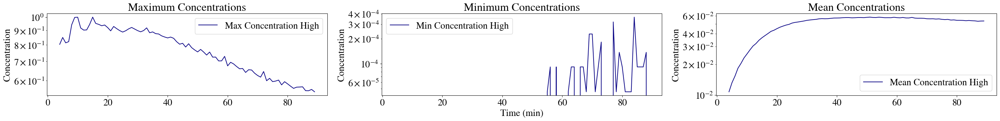

1.0


100%|██████████| 86/86 [00:03<00:00, 24.17it/s]


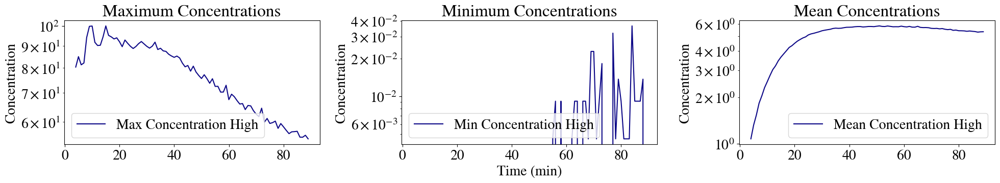

In [61]:
avoid_from=4
avoid_from_org=np.copy(avoid_from)
X_c_H=[]
X_res_H=[]
C_max_H=[]
C_min_H=[]
C_mean_H=[]

X_c_L=[]
X_res_L=[]
C_max_L=[]
C_min_L=[]
C_mean_L=[]

diff_time=[]
all_frames=[]
tol=0.05
for it in tqdm.tqdm(range(avoid_from,len(X_nnf))):
    all_frames.append(it)

    X_frame_H=X_nnf[it]

    time_H=X_frame_H[0,0]

    C_max_H.append(np.max(X_frame_H[:,4:5]))
    C_min_H.append(np.min(X_frame_H[:,4:5]))
    C_mean_H.append(np.mean(X_frame_H[:,4:5]))


# Creating the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(30, 4))

# Plotting Max Concentrations for High and Low
axs[0].plot(all_frames, C_max_H, label='Max Concentration High')
axs[0].set_yscale('log')
axs[0].set_title('Maximum Concentrations')
axs[1].set_xlabel('Time (min)')
axs[0].set_ylabel('Concentration')
axs[0].legend()

# Plotting Min Concentrations for High and Low
axs[1].plot(all_frames, C_min_H, label='Min Concentration High')
axs[1].set_yscale('log')
axs[1].set_title('Minimum Concentrations')
axs[1].set_xlabel('Time (min)')
axs[1].set_ylabel('Concentration')
axs[1].legend()

# Plotting Mean Concentrations for High and Low
axs[2].plot(all_frames, C_mean_H, label='Mean Concentration High')
axs[2].set_yscale('log')
axs[2].set_title('Mean Concentrations')
axs[1].set_xlabel('Time (min)')
axs[2].set_ylabel('Concentration')
axs[2].legend()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

min_H=np.min(C_min_H)
max_H=np.max(C_max_H)-min_H

max_all=max_H
print(max_all)
keep_c=max_H

X_c_H=[]
X_res_H=[]
C_max_H=[]
C_min_H=[]
C_mean_H=[]

X_c_L=[]
X_res_L=[]
C_max_L=[]
C_min_L=[]
C_mean_L=[]
X_nnf_bd=[]
all_frames=[]
for it in tqdm.tqdm(range(avoid_from,len(X_nnf))):
    all_frames.append(it)

    X_frame_H=X_nnf[it,:,:5]-min_H
    idx_keep0=np.argwhere(X_frame_H[:,4]<=keep_c).flatten()
    X_frame_H=X_frame_H[idx_keep0]*np.array([[1,1,1,1,100/keep_c]])

    C_max_H.append(np.max(X_frame_H[:,4:5]))
    C_min_H.append(np.min(X_frame_H[:,4:5]))
    C_mean_H.append(np.mean(X_frame_H[:,4:5]))

    idx_keep=np.argwhere(X_frame_H[:,4]>tol*np.mean(X_frame_H[:,4:5])).flatten()
    X_res_H.append(X_frame_H[idx_keep])
    X_c_H.append(X_frame_H)

    X_nnf_bd.append(X_frame_H)




# Creating the figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 4))

# Plotting Max Concentrations for High and Low
axs[0].plot(all_frames, C_max_H, label='Max Concentration High')
axs[0].set_yscale('log')
axs[0].set_title('Maximum Concentrations')
axs[1].set_xlabel('Time (min)')
axs[0].set_ylabel('Concentration')
axs[0].legend()

# Plotting Min Concentrations for High and Low
axs[1].plot(all_frames, C_min_H, label='Min Concentration High')
axs[1].set_yscale('log')
axs[1].set_title('Minimum Concentrations')
axs[1].set_xlabel('Time (min)')
axs[1].set_ylabel('Concentration')
axs[1].legend()

# Plotting Mean Concentrations for High and Low
axs[2].plot(all_frames, C_mean_H, label='Mean Concentration High')
axs[2].set_yscale('log')
axs[2].set_title('Mean Concentrations')
axs[1].set_xlabel('Time (min)')
axs[2].set_ylabel('Concentration')
axs[2].legend()

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()



In [62]:
import numpy as np
import matplotlib.pyplot as plt
import jax
import jax.numpy as jnp
from jax import vmap
import tqdm

# =============================
# Lognormal Filtering Functions
# =============================
def filter_lognormal_nan(data,key='a', k=3):
    data = np.array(data, dtype=np.float64)  # Ensure it's a NumPy array
    log_data = np.log(data+1e-12)  # Transform to log-space

    mu_log = np.nanmean(log_data)
    min_log = np.nanmin(log_data)
    sigma_log = np.nanstd(log_data)
    # Define filtering bounds
    if key=='c':
        lower_bound = 0.75
    else:
        lower_bound = mu_log - sigma_log

    upper_bound = mu_log + k * sigma_log

    # Identify outliers and replace with NaN
    if key=='c':
        mask = (data >= lower_bound) & (log_data <= upper_bound)
    else:
        mask = (log_data >= lower_bound) & (log_data <= upper_bound)
    
    filtered_data = np.where(mask, data, np.nan)
    return filtered_data

# =============================
# PDF & Plotting Functions
# =============================
def get_pdf(u_hist, bins=30):
    hist, bins = np.histogram(u_hist, bins=bins, density=True)
    return hist, bins

def get_colors_plot(cmap='Spectral', n_colors=5):
    n_colors = n_colors * 2
    cmap = plt.get_cmap(cmap)
    colors = [cmap(i) for i in np.linspace(0, 1, n_colors)]
    return colors[:n_colors // 4] + colors[3 * n_colors // 4:]

def plot_pdf_fields(all_pred, bins=100, time_img=0, figsize=(12, 12), x_lims=None, y_lims=None, mean_vals=None, save_path=None):
    keys = list(all_pred.keys())
    colors = get_colors_plot(n_colors=len(keys))
    
    fig, axs = plt.subplots(2, 3, figsize=figsize)
    axs = axs.flatten()
    
    for i, key in enumerate(keys):
        data = np.array(all_pred[key]).flatten()
        pdf, bins_arr = get_pdf(data[np.isfinite(data)], bins=bins)  # Ignore NaNs in PDF computation

        axs[i].plot(bins_arr[:-1], pdf, color=colors[i], label=f'{key}')
        axs[i].fill_between(bins_arr[:-1], pdf, color=colors[i], alpha=0.3)
        axs[i].set_xlabel(key)
        axs[i].set_ylabel('PDF')
        axs[i].set_yscale('log')  
        axs[i].set_xscale('log')  
        axs[i].set_title(f't={time_img:.2f} min')
        axs[i].legend(loc='upper left')

        # Add vertical dashed line for mean
        if mean_vals and key in mean_vals:
            axs[i].axvline(mean_vals[key], color='k', linestyle='dashed', linewidth=2, label='Mean')
            axs[i].legend(loc='upper left')

        # Apply consistent x-axis and y-axis limits
        if x_lims and key in x_lims:
            axs[i].set_xlim(x_lims[key])
        if y_lims:
            axs[i].set_ylim(y_lims)

    # Hide unused subplots if fewer than 6 fields
    for j in range(len(keys), len(axs)):
        fig.delaxes(axs[j])
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path)
    plt.close()


In [63]:

# ============================
# Main processing loop
# ============================
X_res_H = []
d_t, a_t, b_t, e_t, c_fx, c_std_fx = get_sytem_terms(params)

max_vals = {key: [] for key in ['a', 'b', 'c', 'd', 'e']}
min_vals = {key: [] for key in ['a', 'b', 'c', 'd', 'e']}
mean_vals = {key: [] for key in ['a', 'b', 'c', 'd', 'e']}
mean_vals_log = {key: [] for key in ['a', 'b', 'c', 'd', 'e']}

percentage_discarded = []
overall_max_list = []
keys_system = ['a', 'b','c', 'd', 'e']

thresh_keep = 0.005
plot_all_pdf = False
start = 0
stop = len(X_nnf)

# Storage for axis limits (determined in first snapshot)
x_lims = {}
y_lims = None

for it in tqdm.tqdm(range(avoid_from+start, stop)):
    all_frames.append(it)
    t__frame_plot = it
    snap = np.array([it])

    X_frame_H = X_nnf[it]

    t_test = X_frame_H[:, 0:1]
    x_test = X_frame_H[:, 1:2]
    y_test = X_frame_H[:, 2:3]
    z_test = X_frame_H[:, 3:4]
    c_test = X_frame_H[:, 4:5]

    X_test = np.hstack((t_test, x_test, y_test, z_test))
    
    # Compute raw (unfiltered) predictions
    all_pred_raw = {
        'a': np.abs(vmap(a_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'b': np.abs(vmap(b_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'c': np.abs(vmap(c_fx, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'd': np.abs(vmap(d_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'e': np.abs(vmap(e_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
    }

    # Apply lognormal filtering
    all_pred_filtered = {key: filter_lognormal_nan(all_pred_raw[key],key=key) for key in all_pred_raw}

    # Compute min, max, mean values for each field
    frame_mean_vals = {}
    frame_mean_vals_filter={}
    for key in keys_system:
        max_vals[key].append(jax.device_get(np.nanmax(all_pred_raw[key])).item())
        min_vals[key].append(jax.device_get(np.nanmin(all_pred_raw[key])).item())
        mean_vals[key].append(jax.device_get(np.nanmean(all_pred_raw[key])).item())
        mean_vals_log[key].append(jax.device_get(np.nanmean(all_pred_filtered[key])).item())
        frame_mean_vals[key] = mean_vals[key][-1] 
        frame_mean_vals_filter[key]={mean_vals_log[key][-1]}
    nan_masks = {key: np.isnan(all_pred_filtered[key]) for key in all_pred_filtered}    
    valid_mask = ~np.any(np.stack(list(nan_masks.values())), axis=0)
    intersection_indices_keep = np.where(valid_mask)[0]
    percentage_discarded.append(1-len(intersection_indices_keep)/len(X_frame_H))

    if plot_all_pdf:
        # Set consistent x-axis and y-axis limits based on the first snapshot
        if it == start:
            x_lims = {key: (np.nanmin([1e-7,1]), np.nanmax(all_pred_raw[key])) for key in all_pred_raw}
            y_lims = (1e-6, 1) 
        original_pdf_path = paths['PDF'] + f'{it / len(X_nnf):.3f}.png'
        plot_pdf_fields(all_pred_raw, bins=100, time_img=(T_char / 60) * t_test[0].item(), figsize=(12, 8), 
                        x_lims=x_lims, y_lims=y_lims, mean_vals=frame_mean_vals, save_path=original_pdf_path)

        # Save filtered PDF
        filtered_pdf_path = paths['PDF_filtered'] + f'{it / len(X_nnf):.3f}.png'
        plot_pdf_fields(all_pred_filtered, bins=100, time_img=(T_char / 60) * t_test[0].item(), figsize=(12, 8), 
                        x_lims=x_lims, y_lims=y_lims, mean_vals=frame_mean_vals, save_path=filtered_pdf_path)
if plot_all_pdf:
    video_name='Abs_vals_system_3D.mp4'
    make_video(paths['PDF'], video_name, 10) #
    video_name='Crop_vals_system_3D.mp4'
    make_video(paths['PDF_filtered'], video_name, 10) #

100%|██████████| 86/86 [01:09<00:00,  1.24it/s]


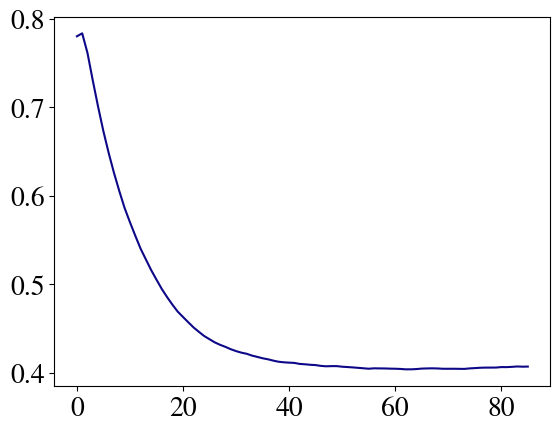

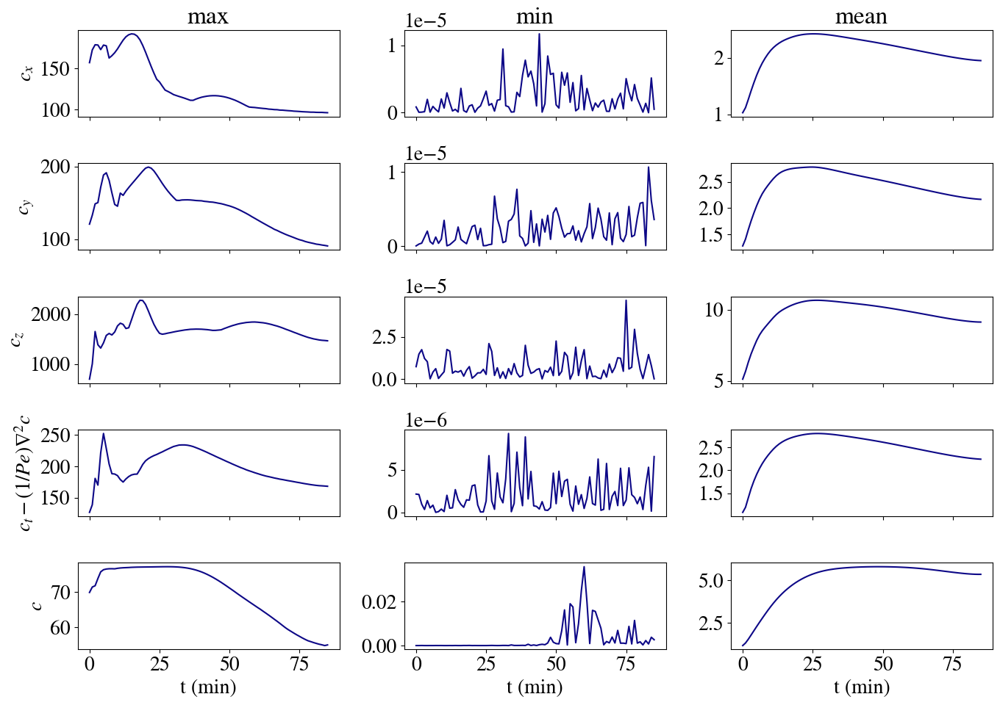

In [64]:
plt.plot(percentage_discarded)
plt.show()
# Extract data for plotting
components = ['a','b','d','e','c']
titles = [r'$c_x$', r'$c_y$', r'$c_z$', r'$c_t-(1/Pe)\nabla^2 c$',r'$c$']

metrics = ['max', 'min', 'mean']
metric_values = {'max': max_vals, 'min': min_vals, 'mean': mean_vals}

# Create a 5-row by 3-column plot (for all components)
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(14, 10), sharex=True)

for i, comp in enumerate(components): 
    for j, metric in enumerate(metrics):
        ax = axes[i, j]
        ax.plot(metric_values[metric][comp], linestyle='-')
        if j ==0:
            ax.set_ylabel(f'{titles[i]}')
        if i ==0:
            ax.set_title(f'{metric}')
        if i == len(components) - 1:
            ax.set_xlabel('t (min)')


plt.tight_layout()
plt.savefig(images_path+'original_dist.png')
plt.show()


In [65]:
import pickle

# Combine everything into a single dictionary
results_dict = {
    'metrics': metric_values,
    'percentage_discarded': percentage_discarded,
}

# Save it using pickle
with open('results_metrics.pkl', 'wb') as f:
    pickle.dump(results_dict, f)

print("Results saved successfully in 'results_metrics.pkl'")


Results saved successfully in 'results_metrics.pkl'


In [66]:
X_res_H=[]

d_t,a_t,b_t,e_t,c_fx,c_std_fx=get_sytem_terms(params)
max_vals={
    'a':[],
    'b':[],
    'c':[],
    'd':[],
    'e':[],
}


min_vals={
    'a':[],
    'b':[],
    'c':[],
    'd':[],
    'e':[],
}


mean_vals={
    'a':[],
    'b':[],
    'c':[],
    'd':[],
    'e':[],
}
percentage_discarded=[]
overall_max_list=[]
keys_system=['a','b','c','d','e']
thresh_keep=0.005
plot_all=False
start=0
#stop=avoid_from+start+1
stop=len(X_nnf)
for it in tqdm.tqdm(range(avoid_from+start,stop)):
    all_frames.append(it)
    t__frame_plot=it
    snap = np.array([it])

    X_frame_H=X_nnf[it]

    t_test=X_frame_H[:,0:1]
    x_test=X_frame_H[:,1:2]
    y_test=X_frame_H[:,2:3]
    z_test=X_frame_H[:,3:4]
    c_test=X_frame_H[:,4:5]

    X_test=np.hstack((t_test,x_test,y_test,z_test))
    all_pred_raw = {
        'a': np.abs(vmap(a_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'b': np.abs(vmap(b_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'c': np.abs(vmap(c_fx, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'd': np.abs(vmap(d_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
        'e': np.abs(vmap(e_t, (0))(X_test[:, 0:layers_1[0]])[:, None]),
    }
    # Apply lognormal filtering
    all_pred_filtered = {key: filter_lognormal_nan(all_pred_raw[key],key=key) for key in all_pred_raw}
    # Extract valid indices
    nan_masks = {key: np.isnan(all_pred_filtered[key].flatten()) for key in all_pred_filtered}
    score = 0
    for key in nan_masks:
        score = score + nan_masks[key].flatten()
    intersection_indices_keep = np.argwhere(score == 0).flatten()
    idx_delete={}
    idx_keep={}
    max_at_it={}
    mean_at_it={}
    all_pred_org={}
    all_pred={}
    for key in keys_system:
        all_pred_org[key]=jax.device_get(all_pred_filtered[key]).copy()
        all_pred[key] = jax.device_get(all_pred_filtered[key]).copy()
        if key=='c':
            max_at_c=jax.device_get(np.nanmax(all_pred[key])).item()
            all_pred[key] = all_pred[key]/max_at_c
        else:
            max_at_it[key]=jax.device_get(np.nanmax(all_pred[key])).item()
            all_pred[key] = all_pred[key]/max_at_it[key]
        mean_at_it[key]=jax.device_get(np.nanmean(all_pred[key])).item()

    # Extract valid indices
    nan_masks = {key: np.isnan(all_pred[key].flatten()) for key in all_pred}
    score = 0
    for key in nan_masks:
        score = score + nan_masks[key].flatten()
    intersection_indices_keep = np.argwhere(score == 0).flatten()
    intersection_indices = np.argwhere(score > 0).flatten()
    overal_max=min(max_at_it.values())
    overall_max_list.append(overal_max)
    for key in keys_system:
        all_pred[key] = jax.device_get(all_pred_org[key])/overal_max
        all_pred[key].flat[intersection_indices] = np.nan
        max_vals[key].append(jax.device_get(np.nanmax(all_pred[key])).item())
        min_vals[key].append(jax.device_get(np.nanmin(all_pred[key])).item())
        mean_vals[key].append(jax.device_get(np.nanmean(all_pred[key])).item())
    
    X_res_subsample=X_frame_H[intersection_indices_keep]
    X_res_H.append(np.hstack((X_res_subsample[:,:4],
                              X_res_subsample[:,0:1]*0+overal_max)))
    percentage_discarded.append(1-len(X_res_subsample[:,:4])/len(X_frame_H))
    if plot_all:
        a_pred  = all_pred['a']
        b_pred  = all_pred['b']
        c_pred  = all_pred_filtered['c']
        e_pred  = all_pred['e']
        d_pred  = all_pred['d']
        c_std_pred  = vmap(c_std_fx, (0))(X_test[:,0:layers_1[0]])[:,None]

        uvwpc_pred   = np.hstack((d_pred,a_pred,b_pred,e_pred,c_pred,c_std_pred))
        d_pred, a_pred, b_pred, e_pred, c_pred,c_std_pred = uvwpc_pred[:, 0:1], uvwpc_pred[:, 1:2], uvwpc_pred[:, 2:3], uvwpc_pred[:, 3:4] , uvwpc_pred[:, 4:5], uvwpc_pred[:, 5:6]
        data_frame = np.hstack((X_test, d_pred, a_pred, b_pred, e_pred, c_pred,c_std_pred))

        idx_plot = np.random.choice(len(y_test), int(len(y_test)), replace=False)
        t_test, x_test, y_test, z_test, d_pred, a_pred, b_pred, e_pred, c_pred,c_std_pred = [np.copy(data_frame[idx_plot, i:i+1]) for i in range(10)]
        c_test = np.copy(c_test[idx_plot])/C_char

        x_midplane = np.median(x_test)
        y_midplane = np.median(y_test)
        z_midplane = np.median(z_test)

        tolerance = 0.5
        x_midplane_filter = np.abs(x_test - x_midplane) <= tolerance
        y_midplane_filter = np.abs(y_test - y_midplane) <= tolerance
        z_midplane_filter = np.abs(z_test - z_midplane) <= tolerance
        variables = [c_test, c_pred,c_std_pred, d_pred, a_pred, b_pred, e_pred]
        variable_names = [r'$\hat{c}$', r'$c$',r'$\sigma_c$' ,r'$c_t-(1/Pe)\nabla^2 c$', r'$c_x$', r'$c_y$', r'$c_z$']
        name_image = System_video_scaled_path + f'time:{t__frame_plot / len(X_nnf):.4f}.png'

        fig = plt.figure(figsize=(15, 2 * len(variables)))

        for i, var in enumerate(variables):
            for j in range(3):
                ax = fig.add_subplot(len(variables), 3, i * 3 + j + 1)
                if j == 0:
                    filter = x_midplane_filter
                    x, y = z_test, y_test
                    xlabel, ylabel = 'Y', 'Z'
                elif j == 1:
                    filter = y_midplane_filter
                    x, y = x_test, z_test
                    xlabel, ylabel = 'X', 'Z'
                else:
                    filter = z_midplane_filter
                    x, y = x_test, y_test
                    xlabel, ylabel = 'X', 'Y'

                #vmin, vmax = global_min[i], global_max[i]  # Use the global min/max values for each variable
                scatter = ax.scatter(x[filter], y[filter], c=var[filter], cmap=cmap, s=5)#], vmin=vmin, vmax=vmax)
                ax.set_title(f'{variable_names[i]} at t={t__frame_plot}')
                ax.set_xlabel(xlabel)
                ax.set_ylabel(ylabel)
                ax.axis('equal')
                ax.axis('off')

                divider = make_axes_locatable(ax)
                cax = divider.append_axes("right", size="5%", pad=0.05)
                plt.colorbar(scatter, cax=cax)

        plt.tight_layout()
        plt.savefig(name_image)
        if stop>avoid_from+start+1:
            plt.close()  
        else:
            plt.show()
if plot_all:
    video_name=dataset_name+'3D.mp4'
    make_video(System_video_scaled_path, video_name, 10) # 10 is the FPS (frames per second)

100%|██████████| 86/86 [01:16<00:00,  1.12it/s]


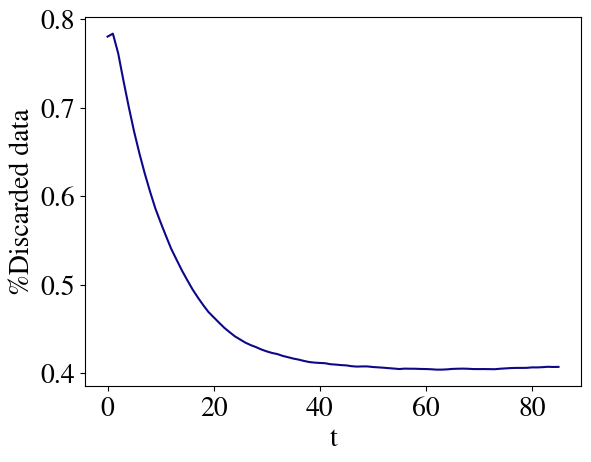

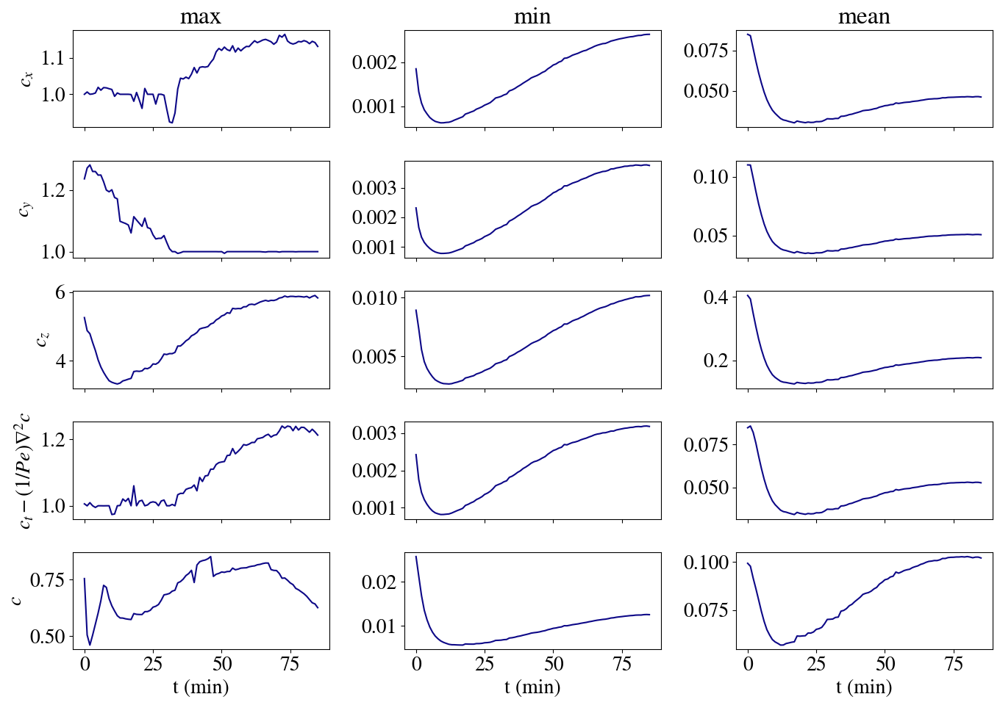

In [67]:
plt.plot(percentage_discarded)
plt.xlabel('t')
plt.ylabel('%Discarded data')
plt.show()
# Extract data for plotting
components = ['a','b','d','e','c']
titles = [r'$c_x$', r'$c_y$', r'$c_z$', r'$c_t-(1/Pe)\nabla^2 c$',r'$c$']

metrics = ['max', 'min', 'mean']
metric_values = {'max': max_vals, 'min': min_vals, 'mean': mean_vals}

# Create a 5-row by 3-column plot (for all components)
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(14, 10), sharex=True)

for i, comp in enumerate(components): 
    for j, metric in enumerate(metrics):
        ax = axes[i, j]
        ax.plot(metric_values[metric][comp], linestyle='-')
        if j ==0:
            ax.set_ylabel(f'{titles[i]}')
        if i ==0:
            ax.set_title(f'{metric}')
        if i == len(components) - 1:
            ax.set_xlabel('t (min)')


plt.tight_layout()
plt.savefig(images_path+'New_dist.png')
plt.show()


In [68]:
import pickle

# Combine everything into a single dictionary
results_dict = {
    'metrics': metric_values,
    'percentage_discarded': percentage_discarded,
}

# Save it using pickle
with open('results_metrics_final.pkl', 'wb') as f:
    pickle.dump(results_dict, f)

print("Results saved successfully in 'results_metrics.pkl'")


Results saved successfully in 'results_metrics.pkl'


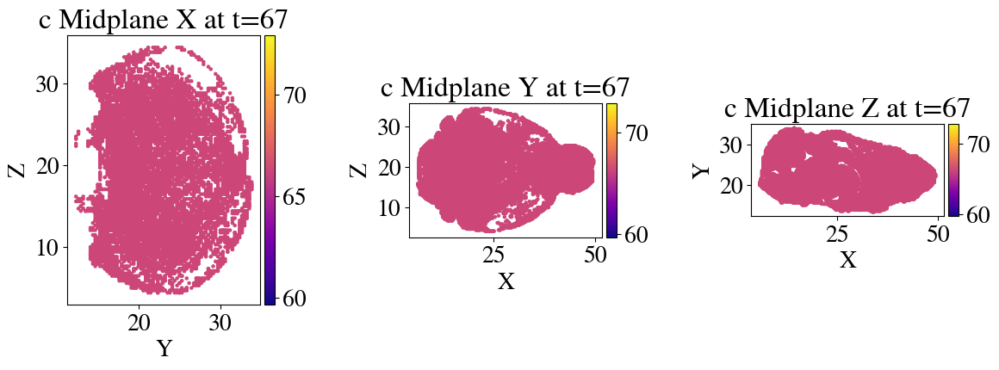

In [69]:
frame=67
X_plot = np.vstack((X_res_H[frame]))

t,x, y, z, c = [X_plot[:, i] for i in range(5)]
t2,x2, y2, z2 = [X_plot[:, i] for i in range(4)]

# Calculate midplane values
x_midplane = np.median(x)
y_midplane = np.median(y)
z_midplane = np.median(z)

tolerance = 0.5 # Adjust based on your dataset's spread

# Define filters for each midplane
x_midplane_filter = np.abs(x - x_midplane) <= tolerance
y_midplane_filter = np.abs(y - y_midplane) <= tolerance
z_midplane_filter = np.abs(z - z_midplane) <= tolerance

x_midplane_filter2 = np.abs(x2 - x_midplane) <= tolerance
y_midplane_filter2 = np.abs(y2 - y_midplane) <= tolerance
z_midplane_filter2 = np.abs(z2 - z_midplane) <= tolerance

# Prepare for visualization

# Variables for plotting
variables = [c]  # Use the scalar field for coloring
variable_names = ['c']

# Visualization
for i, var in enumerate(variables):
    fig = plt.figure(figsize=(12, 8))  # Adjust size as needed

    for j in range(3):
        ax = fig.add_subplot(1, 3, j + 1)
        if j == 0:
            filter_mask = x_midplane_filter
            scatter_x, scatter_y = y[filter_mask], z[filter_mask]
            filter_mask2 = x_midplane_filter2
            scatter_x2, scatter_y2 = y2[filter_mask2], z2[filter_mask2]
            xlabel, ylabel = 'Y', 'Z'
        elif j == 1:
            filter_mask = y_midplane_filter
            scatter_x, scatter_y = x[filter_mask], z[filter_mask]
            filter_mask2 = y_midplane_filter2
            scatter_x2, scatter_y2 = x2[filter_mask2], z2[filter_mask2]
            xlabel, ylabel = 'X', 'Z'
        else:  # j == 2
            filter_mask = z_midplane_filter
            scatter_x, scatter_y = x[filter_mask], y[filter_mask]
            filter_mask2 = z_midplane_filter2
            scatter_x2, scatter_y2 = x2[filter_mask2], y2[filter_mask2]
            xlabel, ylabel = 'X', 'Y'

        # Use the scalar field for coloring
        #scatter = ax.scatter(scatter_x2, scatter_y2,c='green', s=0.1)
        scatter = ax.scatter(scatter_x, scatter_y, c=var[filter_mask], cmap=cmap, s=5)
        ax.set_title(f'{variable_names[i]} Midplane {["X", "Y", "Z"][j]} at t={frame}')
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.axis('equal')
        #ax.axis('off')  # Change to 'off' if you prefer no axis

        # Adding a colorbar to each subplot
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(scatter, cax=cax)

plt.tight_layout()
plt.show()


In [70]:
frames=X_c_H
avoid_from=0
if train_ratio<=0.5:
    skip_frames = int(1 / train_ratio)
    idx_all_frames = np.arange(avoid_from, len(frames))
    idx_Train = np.arange(avoid_from+1, len(frames) - 1, skip_frames)
    idx_Train = np.append([avoid_from], idx_Train)  # Add the first frame
    idx_Train = np.append(idx_Train, [len(frames) - 1])  # Add the last frame
    idx_Test = np.setdiff1d(idx_all_frames, idx_Train)
    print(f'Skipping:{skip_frames}')
    print(f'Training on frames:{idx_Train}')
    print(f'Testing on frames:{idx_Test}')
    print(f'Training on {len(idx_Train)/len(frames)}')
else:
    idx_all_frames =np.arange(avoid_from,len(frames))
    idx_Train=np.random.choice(len(frames)-avoid_from,int((len(frames)-avoid_from)*train_ratio),replace=False)+avoid_from
    idx_Train = np.append([avoid_from], idx_Train)  # Add the first frame
    idx_Train = np.append(idx_Train, [len(frames) - 1])  # Add the last frame
    idx_Train = np.unique(idx_Train)
    idx_Test =np.setdiff1d(idx_all_frames,idx_Train)
    print(f'There are not enough frames to skip')
    print(f'Training on frames:{np.sort(idx_Train)}')
    print(f'Testing on frames:{idx_Test}')
    print(f'Training on {len(idx_Train)/len(frames)}')
X_train=np.zeros((1,5))
for idx in tqdm.tqdm(idx_Train):
    X_train=np.vstack((X_train,X_c_H[idx]))
X_train_H=np.copy(X_train[1:])
X_test=np.zeros((1,5))
for idx in tqdm.tqdm(idx_Test):
    X_test=np.vstack((X_test,X_c_H[idx]))
X_test_H=np.copy(X_test[1:])

Skipping:2
Training on frames:[ 0  1  3  5  7  9 11 13 15 17 19 21 23 25 27 29 31 33 35 37 39 41 43 45
 47 49 51 53 55 57 59 61 63 65 67 69 71 73 75 77 79 81 83 85]
Testing on frames:[ 2  4  6  8 10 12 14 16 18 20 22 24 26 28 30 32 34 36 38 40 42 44 46 48
 50 52 54 56 58 60 62 64 66 68 70 72 74 76 78 80 82 84]
Training on 0.5116279069767442


100%|██████████| 42/42 [00:02<00:00, 17.38it/s]


In [71]:
X_res_H=np.vstack(X_res_H)

X_train_H=np.vstack(X_train_H)
X_test_H=np.vstack(X_test_H)

num_points=150000
if len(X_test_H)<num_points:
    X_GT_H=np.copy(X_test_H)
else:   
    idx_Gt=np.random.choice(len(X_test_H),num_points,replace=False)
    X_GT_H=X_test_H[idx_Gt]

# Printing the shapes of the datasets for verification
print(f"Training set shape high: {X_train_H.shape}")
print(f"Test set shape high: {X_train_H.shape}")
print(f"Test Eval set shape high: {X_GT_H.shape}")
print(f"Residual set shape high: {X_res_H.shape}")

Training set shape high: (20426120, 5)
Test set shape high: (20426120, 5)
Test Eval set shape high: (150000, 5)
Residual set shape high: (21665996, 5)


In [72]:
N_r=1000000
N_d=1000000
idx_res=np.random.choice(len(X_res_H),len(X_res_H),replace=False)
idx_data=np.random.choice(len(X_train_H),len(X_train_H),replace=False)
X_res=X_res_H[idx_res]
X_train=X_train_H[idx_data]
X_GT=X_GT_H

In [73]:
def get_data_between(X_res_H,t_0):
    t_f=t_0+delta_t_2
    idx_0=np.argwhere(X_res_H[:,0]>t_0).flatten()
    idx_f=np.argwhere(X_res_H[:,0]<t_f).flatten()
    idx_keep=np.intersect1d(idx_0,idx_f)
    return X_res_H[idx_keep]
all_times_res=np.sort(np.unique(X_res[:,0]))
t_max=np.max(all_times_res)
t_min=np.min(all_times_res)
n_steps=3
delta_t=(t_max-t_min)/(n_steps)
delta_t_2=0.8*delta_t
print(delta_t,delta_t_2)

X_res_1=get_data_between(X_res_H,t_min)
X_res_2=get_data_between(X_res_H,t_min+delta_t)
X_res_3=get_data_between(X_res_H,t_min+2*delta_t)

8.333333333333332 6.666666666666666


## Data Analytics

In [74]:
# %%
print(f'Bounds for Data Train with {X_train.shape} points:')
print(np.min(X_train,axis=0))
print(np.max(X_train,axis=0))
print(f'Bounds for front tracking Data with {X_init_clean.shape} points:')
print(np.min(X_init_clean,axis=0))
print(np.max(X_init_clean,axis=0))
print(f'Bounds for Data Test with {X_test.shape} points:')
print(np.min(X_test,axis=0))
print(np.max(X_test,axis=0))
print(f'Bounds for Data Eval with {X_GT.shape} points:')
print(np.min(X_GT,axis=0))
print(np.max(X_GT,axis=0))  
print(f'Bounds for Residual_1 Data with {X_res_1.shape} points:')
print(np.min(X_res_1,axis=0))
print(np.max(X_res_1,axis=0))
print(f'Bounds for Residual_2 Data with {X_res_2.shape} points:')
print(np.min(X_res_2,axis=0))
print(np.max(X_res_2,axis=0))
print(f'Bounds for Residual_3 Data with {X_res_3.shape} points:')
print(np.min(X_res_3,axis=0))
print(np.max(X_res_3,axis=0))

# %%
dataset = {
    'Data': X_train,
    'Test': X_test,
    'Res_1': X_res_1,
    'Res_2': X_res_2,
    'Res_3': X_res_3,
    'GT': X_GT
}
lam = {
    'P': 1e-10,
    'Mass': 1e-16,
    'Data': 100,
}
neq = {
    'Data': 2,
    'Test': 1,
    'Res_1': 2,
    'Res_2': 2,
    'Res_3': 2,
    'GT': 1,
}


Bounds for Data Train with (20426120, 5) points:
[ 2.35294118  5.58823522 10.88235308  4.11764699  0.        ]
[ 27.35294118  50.          34.11764818  34.41176414 100.        ]
Bounds for front tracking Data with (379112, 7) points:
[10.          5.58823522 11.17647045  4.41176471 -1.86863869 -1.97500005
 -1.97500005]
[10.         50.         34.11764818 34.41176414  1.95000008  1.95000008
  1.95000008]
Bounds for Data Test with (19497661, 5) points:
[0. 0. 0. 0. 0.]
[27.05882353 50.         34.11764818 34.41176414 99.93134293]
Bounds for Data Eval with (150000, 5) points:
[ 2.94117647  5.58823522 10.88235308  4.11764699  0.        ]
[27.05882353 50.         34.11764818 34.41176414 85.82543991]
Bounds for Residual_1 Data with (4349645, 5) points:
[ 2.64705882  5.58823522 10.88235308  4.11764699 35.38925552]
[  8.82352941  50.          34.11764818  34.41176414 134.28726196]
Bounds for Residual_2 Data with (5986576, 5) points:
[10.88235294  5.58823522 10.88235308  4.11764699 79.84188843

# RBA_Weights

In [75]:
lenghts=[]
for key in dataset.keys():
    lenghts.append(len(dataset[key]))
    print(f'Lenght of {key} dataset: {len(dataset[key])}')
N_train=int(np.max(lenghts))
if batch_size<0:
    batch_size=N_train
All_its=int(np.ceil(N_train/batch_size))
BATCH_SIZES = {}


for key in dataset.keys():
    if not(key == 'GT' or key == 'Test'):
        BATCH_SIZES[key] = int(np.ceil(len(dataset[key]) / All_its))
        if args.Equal_Batch:
            BATCH_SIZES[key]=batch_size
        print(f'Batch size for {key} dataset: {BATCH_SIZES[key]}')
    

lambdas={}
for key in dataset.keys():
    np.random.seed(seed_np)
    if not(key == 'GT' or key == 'Test'):
        lambdas[key] = np.random.uniform(0, 1, size=(len(dataset[key]), neq[key]))
        if init_zero:
            lambdas[key]= lambdas[key]*0+max_lambda/5
        print(f'Lambda shape for {key} dataset: {lambdas[key].shape}')
         



Lenght of Data dataset: 20426120
Lenght of Test dataset: 19497661
Lenght of Res_1 dataset: 4349645
Lenght of Res_2 dataset: 5986576
Lenght of Res_3 dataset: 6352549
Lenght of GT dataset: 150000
Batch size for Data dataset: 10000
Batch size for Res_1 dataset: 10000
Batch size for Res_2 dataset: 10000
Batch size for Res_3 dataset: 10000
Lambda shape for Data dataset: (20426120, 2)
Lambda shape for Res_1 dataset: (4349645, 2)
Lambda shape for Res_2 dataset: (5986576, 2)
Lambda shape for Res_3 dataset: (6352549, 2)


# Loss Functions

In [76]:

def Advec_Diff_Eq_full(params):
    # Neural Network
    fn={
        'P' :lambda x: pinn_fn(params['P'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'c' :lambda x: pinn_fn(params['c'], jnp.array([x[0],x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'c_std' :lambda x: pinn_fn(params['c_std'], jnp.array([x[0],x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'k' :lambda x: pinn_fn(params['k'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['k'], M2_all['k'],activation_fn,norm_fn),
        'D' :lambda x: pinn_fn(params['D'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['D'], M2_all['D'],activation_fn,norm_fn),
    }
    #Pretrained Models
    log_k= (
                 lambda x:-(lb_all['k']+ub_all['k']*jax.nn.sigmoid(fn['k'](x)[0])))
    k= (
                 lambda x: (jnp.exp(log_k(x)+off_set['k']))
                 )
    log_D= (
                 lambda x:-(lb_all['D']+ub_all['D']*jax.nn.sigmoid(fn['D'](x)[0]))
                 )
    D= (
                 lambda x: jnp.exp(log_D(x)+off_set['D'])
                 )

    #New Models
    p,c= (
                 lambda x: fn['P'](x)[0], 
                 lambda x: fn['c'](x)[0],
                 )
    scale_ad = lambda x: x[4]
   # derivatives
    def derivative_fn(f, x, idx):
        """Computes df/dx[idx] using forward mode AD."""
        perturbation = jnp.zeros_like(x)
        perturbation = perturbation.at[idx].set(1.0)
        primals, tangents = jvp(f, (x,), (perturbation,))
        return tangents

    p_x = lambda x: derivative_fn(p, x, 1)
    p_y = lambda x: derivative_fn(p, x, 2)
    p_z = lambda x: derivative_fn(p, x, 3)

    u = lambda x:-p_scale*k(x)*p_x(x)
    v = lambda x:-p_scale*k(x)*p_y(x)
    w = lambda x:-p_scale*k(x)*p_z(x)

    u_x = lambda x: derivative_fn(u, x, 1)
    v_y = lambda x: derivative_fn(v, x, 2)
    w_z = lambda x: derivative_fn(w, x, 3)

    c_t = lambda x: derivative_fn(c, x, 0)
    c_x = lambda x: derivative_fn(c, x, 1)
    c_y = lambda x: derivative_fn(c, x, 2)
    c_z = lambda x: derivative_fn(c, x, 3)
    c_xx = lambda x: derivative_fn(c_x, x, 1)
    c_yy = lambda x: derivative_fn(c_y, x, 2)
    c_zz = lambda x: derivative_fn(c_z, x, 3)

    D_x = lambda x: derivative_fn(D, x, 1)
    D_y = lambda x: derivative_fn(D, x, 2)
    D_z = lambda x: derivative_fn(D, x, 3)

     # equations
    eq0= (
        lambda x:(c_t(x) 
        + (u(x) * c_x(x) + v(x) * c_y(x) + w(x) * c_z(x)) 
        - (1/Pe)*(c_xx(x) + c_yy(x) + c_zz(x)))/scale_ad(x))

    eq6 = lambda x: (u_x(x) + v_y(x) + w_z(x))

    
    return eq0, eq6


In [77]:

def gradients_c(params):
    # Neural Network
    fn={
        'P' :lambda x: pinn_fn(params['P'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'c' :lambda x: pinn_fn(params['c'], jnp.array([x[0],x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'c_std' :lambda x: pinn_fn(params['c_std'], jnp.array([x[0],x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'k' :lambda x: pinn_fn(params['k'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['k'], M2_all['k'],activation_fn,norm_fn),
        'D' :lambda x: pinn_fn(params['D'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['D'], M2_all['D'],activation_fn,norm_fn),
    }

    #New Models
    c= lambda x: fn['c'](x)[0]
   # derivatives
    def derivative_fn(f, x, idx):
        """Computes df/dx[idx] using forward mode AD."""
        perturbation = jnp.zeros_like(x)
        perturbation = perturbation.at[idx].set(1.0)
        primals, tangents = jvp(f, (x,), (perturbation,))
        return tangents

    c_t = lambda x: derivative_fn(c, x, 0)
    c_x = lambda x: derivative_fn(c, x, 1)
    c_y = lambda x: derivative_fn(c, x, 2)
    c_z = lambda x: derivative_fn(c, x, 3)
    c_xx = lambda x: derivative_fn(c_x, x, 1)
    c_yy = lambda x: derivative_fn(c_y, x, 2)
    c_zz = lambda x: derivative_fn(c_z, x, 3)

  
    return c_x, c_y,c_z,c_xx,c_yy,c_zz


In [78]:
sigma_0=0.01
k_loss=jnp.log(sigma_0**2)/2
def NLL(r,sigma,weight=1):# r is the residual r=(y-mu), sigma is the sandard deviation
    nnl=jnp.log(sigma**2)/2+(r)**2/(2*sigma**2)-k_loss
    return jnp.mean(weight*nnl)

In [79]:
def u_PINN(params):
    # Neural Network
    fn={
        'P' :lambda x: pinn_fn(params['P'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'c' :lambda x: pinn_fn(params['c'], jnp.array([x[0],x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'c_std' :lambda x: pinn_fn(params['c_std'], jnp.array([x[0],x[1],x[2],x[3]]), M1_all['c'], M2_all['c'],activation_fn,norm_fn),
        'k' :lambda x: pinn_fn(params['k'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['k'], M2_all['k'],activation_fn,norm_fn),
        'D' :lambda x: pinn_fn(params['D'], jnp.array([0.0,x[1],x[2],x[3]]), M1_all['D'], M2_all['D'],activation_fn,norm_fn),
    }
    #Pretrained Models
    log_k= (
                 lambda x:-(lb_all['k']+ub_all['k']*jax.nn.sigmoid(fn['k'](x)[0])))
    k= (
                 lambda x: (jnp.exp(log_k(x)+off_set['k']))
                 )
    log_D= (
                 lambda x:-(lb_all['D']+ub_all['D']*jax.nn.sigmoid(fn['D'](x)[0]))
                 )
    D= (
                 lambda x: jnp.exp(log_D(x)+off_set['D'])
                 )
    #New Models
    p,c,c_std= (
                 lambda x: fn['P'](x)[0], 
                 lambda x: fn['c'](x)[0],
                 lambda x: 10*jax.nn.sigmoid(fn['c_std'](x)[0])+sigma_0,
                 )
   # derivatives
    def derivative_fn(f, x, idx):
        """Computes df/dx[idx] using forward mode AD."""
        perturbation = jnp.zeros_like(x)
        perturbation = perturbation.at[idx].set(1.0)
        primals, tangents = jvp(f, (x,), (perturbation,))
        return tangents

    p_x = lambda x: derivative_fn(p, x, 1)
    p_y = lambda x: derivative_fn(p, x, 2)
    p_z = lambda x: derivative_fn(p, x, 3)

    u = lambda x:-p_scale*k(x)*p_x(x)
    v = lambda x:-p_scale*k(x)*p_y(x)
    w = lambda x:-p_scale*k(x)*p_z(x)
    return u,v,w,p,c,D,k,c_std

u_model=u_PINN


## Training

In [80]:
def compute_prediction(X, funcs):
    result = jnp.zeros((X.shape[0], len(funcs)))
    for i, fn in enumerate(funcs):
        result = result.at[:, i].set(vmap(fn, (0))(X[:, :layers_ref[0]]).flatten())
    return result

In [81]:
key='Permeability'
Dataset2={}
Dataset2['Permeability']=X_init_clean
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
# Further computations for errors if any
K_pred  = vmap(k_fx, (0))(Dataset2[key][:,0:layers_ref[0]])[:,None]*k_char
print(K_pred.min())
print(K_pred.max())


9.6456916e-17
1.0092614e-12


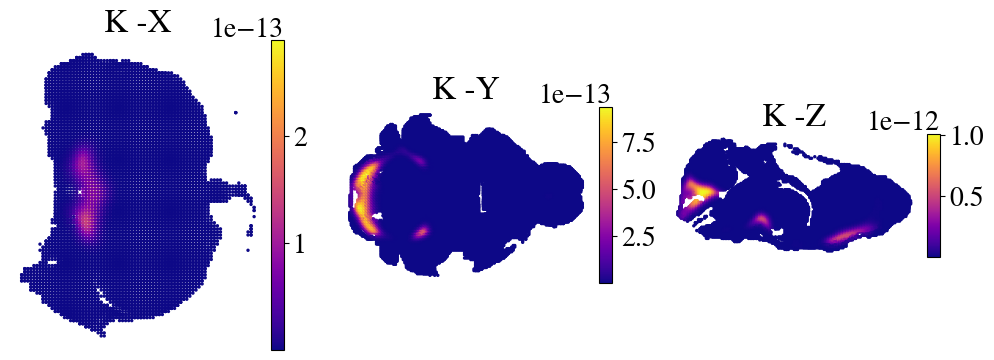

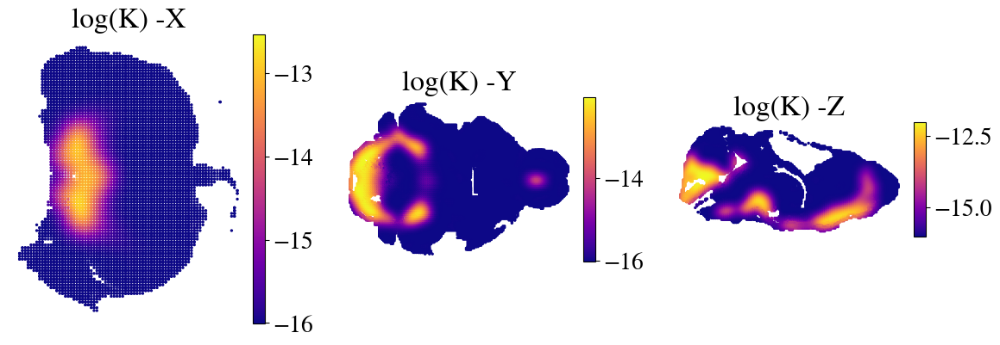

In [82]:
t,x, y, z= Dataset2[key][:,0], Dataset2[key][:,1], Dataset2[key][:,2], Dataset2[key][:,3]
# Calculate midplane values
x_midplane = np.median(x)
y_midplane = np.median(y)
z_midplane = np.median(z)

tolerance = 0.3  # Adjust based on your dataset's spread

# Define filters for each midplane
x_midplane_filter = np.abs(x - x_midplane) <= tolerance
y_midplane_filter = np.abs(y - y_midplane) <= tolerance
z_midplane_filter = np.abs(z - z_midplane) <= tolerance

# Prepare for visualization

# Variables for plotting
variables = [K_pred,np.log10(K_pred)]  # Use the scalar field for coloring
variable_names = ['K','log(K)']

# Visualization
for i, var in enumerate(variables):
    fig = plt.figure(figsize=(12, 8))  # Adjust size as needed

    for j in range(3):
        ax = fig.add_subplot(1, 3, j + 1)
        if j == 0:
            filter_mask = x_midplane_filter
            scatter_x, scatter_y = y[filter_mask], z[filter_mask]
            xlabel, ylabel = 'Y', 'Z'
        elif j == 1:
            filter_mask = y_midplane_filter
            scatter_x, scatter_y = x[filter_mask], z[filter_mask]
            xlabel, ylabel = 'X', 'Z'
        else:  # j == 2
            filter_mask = z_midplane_filter
            scatter_x, scatter_y = x[filter_mask], y[filter_mask]
            xlabel, ylabel = 'X', 'Y' 

        # Use the scalar field for coloring
        scatter = ax.scatter(scatter_x, scatter_y, c=var[filter_mask], cmap=cmap, s=2)
        ax.set_title(f'{variable_names[i]} -{["X", "Y", "Z"][j]}')
        #ax.set_xlabel(xlabel)
        #ax.set_ylabel(ylabel)
        ax.axis('equal')
        ax.axis('off')  # Change to 'off' if you prefer no axis

        # Adding a colorbar to each subplot
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(scatter, cax=cax)

plt.tight_layout()
plt.savefig(images_path+'Final_results.png')
plt.show()


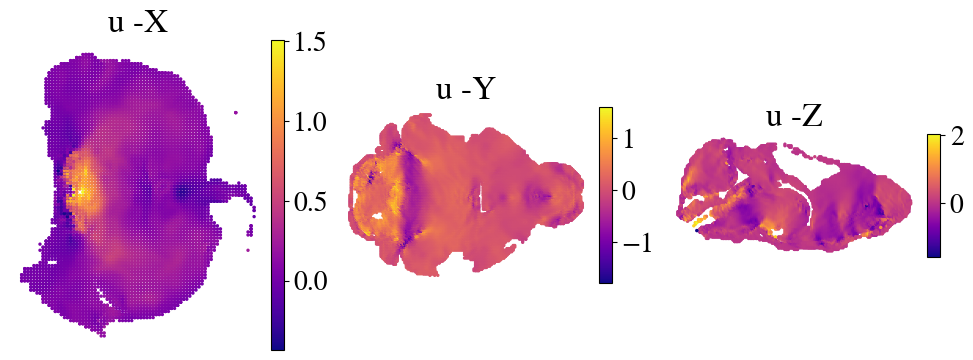

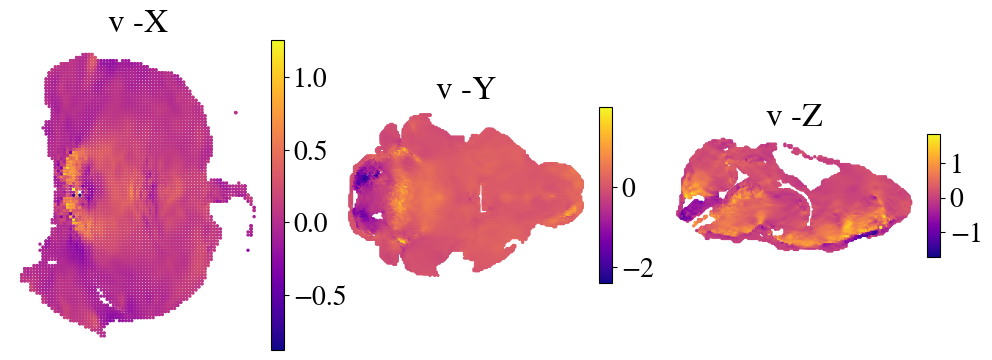

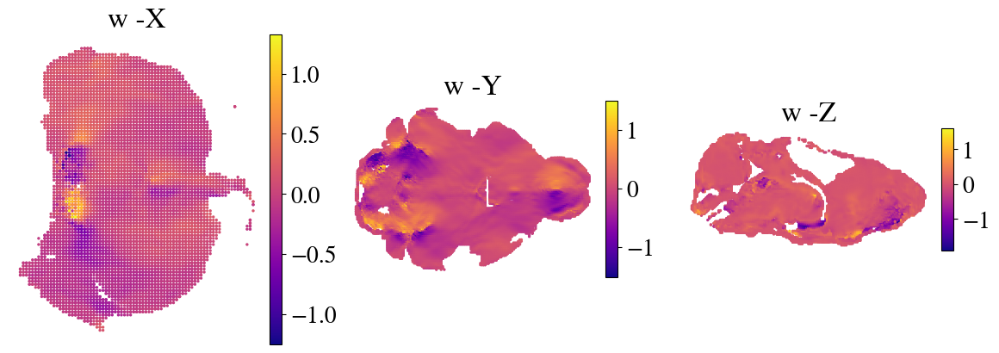

In [83]:
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
# Further computations for errors if any
u_pred  = vmap(u_fx, (0))(Dataset2[key][:,0:layers_ref[0]])[:,None]
v_pred  = vmap(v_fx, (0))(Dataset2[key][:,0:layers_ref[0]])[:,None]
w_pred  = vmap(w_fx, (0))(Dataset2[key][:,0:layers_ref[0]])[:,None]

t,x, y, z= Dataset2[key][:,0], Dataset2[key][:,1], Dataset2[key][:,2], Dataset2[key][:,3]
# Calculate midplane values
x_midplane = np.median(x)
y_midplane = np.median(y)
z_midplane = np.median(z)

tolerance = 0.3  # Adjust based on your dataset's spread

# Define filters for each midplane
x_midplane_filter = np.abs(x - x_midplane) <= tolerance
y_midplane_filter = np.abs(y - y_midplane) <= tolerance
z_midplane_filter = np.abs(z - z_midplane) <= tolerance

# Prepare for visualization

# Variables for plotting
variables = [u_pred,v_pred,w_pred]  # Use the scalar field for coloring
variable_names = ['u','v','w']

# Visualization
for i, var in enumerate(variables):
    fig = plt.figure(figsize=(12, 8))  # Adjust size as needed

    for j in range(3):
        ax = fig.add_subplot(1, 3, j + 1)
        if j == 0:
            filter_mask = x_midplane_filter
            scatter_x, scatter_y = y[filter_mask], z[filter_mask]
            xlabel, ylabel = 'Y', 'Z'
        elif j == 1:
            filter_mask = y_midplane_filter
            scatter_x, scatter_y = x[filter_mask], z[filter_mask]
            xlabel, ylabel = 'X', 'Z'
        else:  # j == 2
            filter_mask = z_midplane_filter
            scatter_x, scatter_y = x[filter_mask], y[filter_mask]
            xlabel, ylabel = 'X', 'Y' 

        # Use the scalar field for coloring
        scatter = ax.scatter(scatter_x, scatter_y, c=var[filter_mask], cmap=cmap, s=2)
        ax.set_title(f'{variable_names[i]} -{["X", "Y", "Z"][j]}')
        #ax.set_xlabel(xlabel)
        #ax.set_ylabel(ylabel)
        ax.axis('equal')
        ax.axis('off')  # Change to 'off' if you prefer no axis

        # Adding a colorbar to each subplot
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(scatter, cax=cax)

plt.tight_layout()
plt.savefig(images_path+'Pre_results.png')
plt.show()



In [84]:
@jit
def update_stage_2(params, lambdas,lam,Pe, opt_state, dataset: Dict[str, np.ndarray], batch_indices: Dict[str, np.ndarray]):
    # Compute the predictions based on the given functions.
    def compute_prediction(X, funcs):
        result = jnp.zeros((X.shape[0], len(funcs)))
        for i, fn in enumerate(funcs):
            result = result.at[:, i].set(vmap(fn, (0))(X).flatten())
        return result
    def get_residuals_and_multipliers(key, dataset, functions, lambdas, target, it_details=None):
        batch_indices,gamma,lr_lambdas_0,use_RBA=it_details
        pred = compute_prediction(dataset[key], functions)
        residuals = jnp.abs(pred - target)
        lam_key = (gamma) * lambdas[key][batch_indices[key]] + lr_lambdas_0 * residuals / (jnp.max(residuals, axis=0) + 10**(-8))
        lambdas[key] = lambdas[key].at[batch_indices[key]].set(lam_key)
        lam_key = lam_key * use_RBA + 0.1
        return residuals,lam_key,lambdas
    it_details=(batch_indices,gamma,lr_lambdas_0,use_RBA)
    def loss_fn(params,lambdas):
        # eqn error
        eq0, eq6= Advec_Diff_Eq_full(params)
        u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
        # Initialize dictionaries
        residuals={}
        multipliers={}
        # Equations
        residuals['Res_1'],multipliers['Res_1'],lambdas = get_residuals_and_multipliers('Res_1', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_2'],multipliers['Res_2'],lambdas = get_residuals_and_multipliers('Res_2', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_3'],multipliers['Res_3'],lambdas = get_residuals_and_multipliers('Res_3', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Data'],multipliers['Data'],lambdas  = get_residuals_and_multipliers('Data', dataset, #Dataset to compute predictions
                                                             [c_fx,c_std_fx], #Functions to evaluate
                                                             lambdas,  # local multiplieers
                                                             dataset['Data'][:,4:6],
                                                             it_details)

        #Calculate Stds
        sigma_c=compute_prediction(dataset['Data'], [c_std_fx])

        
        loss_vals = {
            'AD': lam['P']*(Error_fn(residuals['Res_1'][:, 0:1], 0.0, weight=multipliers['Res_1'][:, 0:1])
                           +Error_fn(residuals['Res_2'][:, 0:1], 0.0, weight=multipliers['Res_2'][:, 0:1])
                           +Error_fn(residuals['Res_3'][:, 0:1], 0.0, weight=multipliers['Res_3'][:, 0:1])),
            'Mass':use_mass*lam['Mass']*(Error_fn(residuals['Res_1'][:, 1:2], 0.0, weight=multipliers['Res_1'][:, 1:2])
                                        +Error_fn(residuals['Res_2'][:, 1:2], 0.0, weight=multipliers['Res_2'][:, 1:2])
                                        +Error_fn(residuals['Res_3'][:, 1:2], 0.0, weight=multipliers['Res_3'][:, 1:2])),
            'c' :  Error_fn(residuals['Data'][:, 0:1], 0.0, weight=multipliers['Data'][:, 0:1]),
            #'c_std' :  lam['Data']*NLL(residuals['Data'][:, 0:1], sigma_c, weight=multipliers['Data'][:, 1:2]),
        }
        Error_vals = {
            'AD':  (jnp.mean(residuals['Res_1'][:, 0:1])
                   +jnp.mean(residuals['Res_2'][:, 0:1])
                   +jnp.mean(residuals['Res_3'][:, 0:1])),
            'Mass':(jnp.mean(residuals['Res_1'][:, 1:2])
                   +jnp.mean(residuals['Res_2'][:, 1:2])
                   +jnp.mean(residuals['Res_3'][:, 1:2])),
            'c' :  jnp.mean(residuals['Data'][:, 0:1]),
        }

        # Total Loss
        total_loss = sum(loss_vals.values())

        return total_loss, (Error_vals, lambdas)

    # Compute gradients of the loss function with respect to parameters.
    grad_fn = value_and_grad(loss_fn, has_aux=True)
    (_, loss_dict_and_lambdas), grads = grad_fn(params,lambdas)
    losses_dict = loss_dict_and_lambdas[0]
    updated_lambdas = loss_dict_and_lambdas[1]

    # Update model parameters based on the calculated gradients.
    updates={}
    updates['P'], opt_state['P'] = optimizer['P'].update(grads['P'], opt_state['P'], params['P'])
    params['P'] = optax.apply_updates(params['P'], updates['P'])
    

    return params, updated_lambdas, opt_state, losses_dict


In [85]:
@jit
def update_stage_3(params, lambdas,lam,Pe, opt_state, dataset: Dict[str, np.ndarray], batch_indices: Dict[str, np.ndarray]):
    # Compute the predictions based on the given functions.
    def compute_prediction(X, funcs):
        result = jnp.zeros((X.shape[0], len(funcs)))
        for i, fn in enumerate(funcs):
            result = result.at[:, i].set(vmap(fn, (0))(X).flatten())
        return result
    def get_residuals_and_multipliers(key, dataset, functions, lambdas, target, it_details=None):
        batch_indices,gamma,lr_lambdas_0,use_RBA=it_details
        pred = compute_prediction(dataset[key], functions)
        residuals = jnp.abs(pred - target)
        lam_key = (gamma) * lambdas[key][batch_indices[key]] + lr_lambdas_0 * residuals / (jnp.max(residuals, axis=0) + 10**(-8))
        lambdas[key] = lambdas[key].at[batch_indices[key]].set(lam_key)
        lam_key = lam_key * use_RBA + 0.1
        return residuals,lam_key,lambdas
    it_details=(batch_indices,gamma,lr_lambdas_0,use_RBA)
    def loss_fn(params,lambdas):
        # eqn error
        eq0, eq6= Advec_Diff_Eq_full(params)
        u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
        # Initialize dictionaries
        residuals={}
        multipliers={}
        # Equations
        residuals['Res_1'],multipliers['Res_1'],lambdas = get_residuals_and_multipliers('Res_1', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_2'],multipliers['Res_2'],lambdas = get_residuals_and_multipliers('Res_2', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_3'],multipliers['Res_3'],lambdas = get_residuals_and_multipliers('Res_3', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Data'],multipliers['Data'],lambdas  = get_residuals_and_multipliers('Data', dataset, #Dataset to compute predictions
                                                             [c_fx,c_std_fx], #Functions to evaluate
                                                             lambdas,  # local multiplieers
                                                             dataset['Data'][:,4:6],
                                                             it_details)
        #Calculate Stds
        sigma_c=compute_prediction(dataset['Data'], [c_std_fx])

        
        loss_vals = {
            'AD': lam['P']*(Error_fn(residuals['Res_1'][:, 0:1], 0.0, weight=multipliers['Res_1'][:, 0:1])
                           +Error_fn(residuals['Res_2'][:, 0:1], 0.0, weight=multipliers['Res_2'][:, 0:1])
                           +Error_fn(residuals['Res_3'][:, 0:1], 0.0, weight=multipliers['Res_3'][:, 0:1])),
            'Mass':use_mass*lam['Mass']*(Error_fn(residuals['Res_1'][:, 1:2], 0.0, weight=multipliers['Res_1'][:, 1:2])
                                        +Error_fn(residuals['Res_2'][:, 1:2], 0.0, weight=multipliers['Res_2'][:, 1:2])
                                        +Error_fn(residuals['Res_3'][:, 1:2], 0.0, weight=multipliers['Res_3'][:, 1:2])),
            'c' :  lam['Data']*Error_fn(residuals['Data'][:, 0:1], 0.0, weight=multipliers['Data'][:, 0:1]),
            #'c_std' :  lam['Data']*NLL(residuals['Data'][:, 0:1], sigma_c, weight=multipliers['Data'][:, 1:2]),
        }
        Error_vals = {
            'AD':  (jnp.mean(residuals['Res_1'][:, 0:1])
                   +jnp.mean(residuals['Res_2'][:, 0:1])
                   +jnp.mean(residuals['Res_3'][:, 0:1])),
            'Mass':(jnp.mean(residuals['Res_1'][:, 1:2])
                   +jnp.mean(residuals['Res_2'][:, 1:2])
                   +jnp.mean(residuals['Res_3'][:, 1:2])),
            'c' :  jnp.mean(residuals['Data'][:, 0:1]),
        }

        # Total Loss
        total_loss = sum(loss_vals.values())

        return total_loss, (Error_vals, lambdas)

    # Compute gradients of the loss function with respect to parameters.
    grad_fn = value_and_grad(loss_fn, has_aux=True)
    (_, loss_dict_and_lambdas), grads = grad_fn(params,lambdas)
    losses_dict = loss_dict_and_lambdas[0]
    updated_lambdas = loss_dict_and_lambdas[1]

    # Update model parameters based on the calculated gradients.
    updates={}
    updates['P'], opt_state['P'] = optimizer['P'].update(grads['P'], opt_state['P'], params['P'])
    params['P'] = optax.apply_updates(params['P'], updates['P'])
    updates['k'], opt_state['k'] = optimizer['k'].update(grads['k'], opt_state['k'], params['k'])
    params['k'] = optax.apply_updates(params['k'], updates['k'])
    return params, updated_lambdas, opt_state, losses_dict


In [86]:
@jit
def update_stage_4(params, lambdas,lam,Pe, opt_state, dataset: Dict[str, np.ndarray], batch_indices: Dict[str, np.ndarray]):
    # Compute the predictions based on the given functions.
    def compute_prediction(X, funcs):
        result = jnp.zeros((X.shape[0], len(funcs)))
        for i, fn in enumerate(funcs):
            result = result.at[:, i].set(vmap(fn, (0))(X).flatten())
        return result
    def get_residuals_and_multipliers(key, dataset, functions, lambdas, target, it_details=None):
        batch_indices,gamma,lr_lambdas_0,use_RBA=it_details
        pred = compute_prediction(dataset[key], functions)
        residuals = jnp.abs(pred - target)
        lam_key = (gamma) * lambdas[key][batch_indices[key]] + lr_lambdas_0 * residuals / (jnp.max(residuals, axis=0) + 10**(-8))
        lambdas[key] = lambdas[key].at[batch_indices[key]].set(lam_key)
        lam_key = lam_key * use_RBA + 0.1
        return residuals,lam_key,lambdas
    it_details=(batch_indices,gamma,lr_lambdas_0,use_RBA)
    def loss_fn(params,lambdas):
        # eqn error
        eq0, eq6= Advec_Diff_Eq_full(params)
        u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
        # Initialize dictionaries
        residuals={}
        multipliers={}
        # Equations
        residuals['Res_1'],multipliers['Res_1'],lambdas = get_residuals_and_multipliers('Res_1', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_2'],multipliers['Res_2'],lambdas = get_residuals_and_multipliers('Res_2', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_3'],multipliers['Res_3'],lambdas = get_residuals_and_multipliers('Res_3', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Data'],multipliers['Data'],lambdas  = get_residuals_and_multipliers('Data', dataset, #Dataset to compute predictions
                                                             [c_fx,c_std_fx], #Functions to evaluate
                                                             lambdas,  # local multiplieers
                                                             dataset['Data'][:,4:6],
                                                             it_details)

        #Calculate Stds
        sigma_c=compute_prediction(dataset['Data'], [c_std_fx])

        
        loss_vals = {
            'AD': lam['P']*(Error_fn(residuals['Res_1'][:, 0:1], 0.0, weight=multipliers['Res_1'][:, 0:1])
                           +Error_fn(residuals['Res_2'][:, 0:1], 0.0, weight=multipliers['Res_2'][:, 0:1])
                           +Error_fn(residuals['Res_3'][:, 0:1], 0.0, weight=multipliers['Res_3'][:, 0:1])),
            'Mass':use_mass*lam['Mass']*(Error_fn(residuals['Res_1'][:, 1:2], 0.0, weight=multipliers['Res_1'][:, 1:2])
                                        +Error_fn(residuals['Res_2'][:, 1:2], 0.0, weight=multipliers['Res_2'][:, 1:2])
                                        +Error_fn(residuals['Res_3'][:, 1:2], 0.0, weight=multipliers['Res_3'][:, 1:2])),
            'c' :  lam['Data']*Error_fn(residuals['Data'][:, 0:1], 0.0, weight=multipliers['Data'][:, 0:1]),
            #'c_std' :  lam['Data']*NLL(residuals['Data'][:, 0:1], sigma_c, weight=multipliers['Data'][:, 1:2]),
        }
        Error_vals = {
            'AD':  (jnp.mean(residuals['Res_1'][:, 0:1])
                   +jnp.mean(residuals['Res_2'][:, 0:1])
                   +jnp.mean(residuals['Res_3'][:, 0:1])),
            'Mass':(jnp.mean(residuals['Res_1'][:, 1:2])
                   +jnp.mean(residuals['Res_2'][:, 1:2])
                   +jnp.mean(residuals['Res_3'][:, 1:2])),
            'c' :  jnp.mean(residuals['Data'][:, 0:1]),
        }

        # Total Loss
        total_loss = sum(loss_vals.values())

        return total_loss, (Error_vals, lambdas)

    # Compute gradients of the loss function with respect to parameters.
    grad_fn = value_and_grad(loss_fn, has_aux=True)
    (_, loss_dict_and_lambdas), grads = grad_fn(params,lambdas)
    losses_dict = loss_dict_and_lambdas[0]
    updated_lambdas = loss_dict_and_lambdas[1]

    # Update model parameters based on the calculated gradients.
    updates={}
    updates['P'], opt_state['P'] = optimizer['P'].update(grads['P'], opt_state['P'], params['P'])
    params['P'] = optax.apply_updates(params['P'], updates['P'])
    updates['c'], opt_state['c'] = optimizer['c'].update(grads['c'], opt_state['c'], params['c'])
    params['c'] = optax.apply_updates(params['c'], updates['c'])
    updates['k'], opt_state['k'] = optimizer['k'].update(grads['k'], opt_state['k'], params['k'])
    params['k'] = optax.apply_updates(params['k'], updates['k'])
    

    return params, updated_lambdas, opt_state, losses_dict


In [87]:
@jit
def update_stage_5(params, lambdas,lam,Pe, opt_state, dataset: Dict[str, np.ndarray], batch_indices: Dict[str, np.ndarray]):
    # Compute the predictions based on the given functions.
    def compute_prediction(X, funcs):
        result = jnp.zeros((X.shape[0], len(funcs)))
        for i, fn in enumerate(funcs):
            result = result.at[:, i].set(vmap(fn, (0))(X).flatten())
        return result
    def get_residuals_and_multipliers(key, dataset, functions, lambdas, target, it_details=None):
        batch_indices,gamma,lr_lambdas_0,use_RBA=it_details
        pred = compute_prediction(dataset[key], functions)
        residuals = jnp.abs(pred - target)
        lam_key = (gamma) * lambdas[key][batch_indices[key]] + lr_lambdas_0 * residuals / (jnp.max(residuals, axis=0) + 10**(-8))
        lambdas[key] = lambdas[key].at[batch_indices[key]].set(lam_key)
        lam_key = lam_key * use_RBA + 0.1
        return residuals,lam_key,lambdas
    it_details=(batch_indices,gamma,lr_lambdas_0,use_RBA)
    def loss_fn(params,lambdas):
        # eqn error
        eq0, eq6= Advec_Diff_Eq_full(params)
        u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
        # Initialize dictionaries
        residuals={}
        multipliers={}
        # Equations
        residuals['Res_1'],multipliers['Res_1'],lambdas = get_residuals_and_multipliers('Res_1', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_2'],multipliers['Res_2'],lambdas = get_residuals_and_multipliers('Res_2', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Res_3'],multipliers['Res_3'],lambdas = get_residuals_and_multipliers('Res_3', dataset, #Dataset to compute predictions
                                                             [eq0, eq6 ], #Functions to evaluate
                                                             lambdas,  # local multipliers(NOTICE IT IS LAMBDA_0)
                                                             0.0,
                                                             it_details) 
        residuals['Data'],multipliers['Data'],lambdas  = get_residuals_and_multipliers('Data', dataset, #Dataset to compute predictions
                                                             [c_fx,c_std_fx], #Functions to evaluate
                                                             lambdas,  # local multiplieers
                                                             dataset['Data'][:,4:6],
                                                             it_details)

        #Calculate Stds
        sigma_c=compute_prediction(dataset['Data'], [c_std_fx])

        
        loss_vals = {
            'AD': lam['P']*(MAE(residuals['Res_1'][:, 0:1], 0.0, weight=multipliers['Res_1'][:, 0:1])
                           +MAE(residuals['Res_2'][:, 0:1], 0.0, weight=multipliers['Res_2'][:, 0:1])
                           +MAE(residuals['Res_3'][:, 0:1], 0.0, weight=multipliers['Res_3'][:, 0:1])),
            'Mass':use_mass*lam['Mass']*(MAE(residuals['Res_1'][:, 1:2], 0.0, weight=multipliers['Res_1'][:, 1:2])
                                        +MAE(residuals['Res_2'][:, 1:2], 0.0, weight=multipliers['Res_2'][:, 1:2])
                                        +MAE(residuals['Res_3'][:, 1:2], 0.0, weight=multipliers['Res_3'][:, 1:2])),
            'c' :  lam['Data']*Error_fn(residuals['Data'][:, 0:1], 0.0, weight=multipliers['Data'][:, 0:1]),
            #'c_std' :  lam['Data']*NLL(residuals['Data'][:, 0:1], sigma_c, weight=multipliers['Data'][:, 1:2]),
        }
        Error_vals = {
            'AD':  (jnp.mean(residuals['Res_1'][:, 0:1])
                   +jnp.mean(residuals['Res_2'][:, 0:1])
                   +jnp.mean(residuals['Res_3'][:, 0:1])),
            'Mass':(jnp.mean(residuals['Res_1'][:, 1:2])
                   +jnp.mean(residuals['Res_2'][:, 1:2])
                   +jnp.mean(residuals['Res_3'][:, 1:2])),
            'c' :  jnp.mean(residuals['Data'][:, 0:1]),
        }

        # Total Loss
        total_loss = sum(loss_vals.values())

        return total_loss, (Error_vals, lambdas)

    # Compute gradients of the loss function with respect to parameters.
    grad_fn = value_and_grad(loss_fn, has_aux=True)
    (_, loss_dict_and_lambdas), grads = grad_fn(params,lambdas)
    losses_dict = loss_dict_and_lambdas[0]
    updated_lambdas = loss_dict_and_lambdas[1]

    # Update model parameters based on the calculated gradients.
    updates={}
    updates['P'], opt_state['P'] = optimizer['P'].update(grads['P'], opt_state['P'], params['P'])
    params['P'] = optax.apply_updates(params['P'], updates['P'])
    updates['c'], opt_state['c'] = optimizer['c'].update(grads['c'], opt_state['c'], params['c'])
    params['c'] = optax.apply_updates(params['c'], updates['c'])
    updates['k'], opt_state['k'] = optimizer['k'].update(grads['k'], opt_state['k'], params['k'])
    params['k'] = optax.apply_updates(params['k'], updates['k'])    

    return params, updated_lambdas, opt_state, losses_dict


In [88]:
# %%
if normalization.lower()=='fourier_time':
    M1=generate_random_matrix(embed_size//(2*input_dim),input_dim)
    M2=10
elif normalization.lower()=='fourier':
    M1=generate_random_matrix(embed_size//(2*input_dim),input_dim)
    M2=10
else:
    M1= Norm_metric1(dataset['Data'][:, :layers_ref[0]])
    M2= Norm_metric2(dataset['Data'][:, :layers_ref[0]])

# Training


In [89]:
save_params_dict(params,result_path,dataset_name,type='Test')
def compute_error_metrics(params,key='GT'):
    u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
    # Further computations for errors if any
    c_pred  = vmap(c_fx, (0))(dataset[key][:,0:layers_ref[0]])[:,None]
    error_c = relative_error2(c_pred, dataset[key][:,4:5])
    return error_c
def compute_error_permeability(params):
    key='Permeability'
    u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
    # Further computations for errors if any
    K_pred  = vmap(k_fx, (0))(Dataset2[key][:,0:layers_ref[0]])[:,None]
    K_real  =Dataset2[key][:,5:6]
    K_SI=K_pred*k_char
    RL2_K = relative_error2(K_pred*k_char, K_real*k_char)
    return RL2_K

1it [00:00, 152.72it/s]


Params P have been saved!


1it [00:00, 161.28it/s]


Params c have been saved!


1it [00:00, 168.68it/s]


Params c_std have been saved!


1it [00:00, 197.65it/s]


Params k have been saved!


1it [00:00, 161.86it/s]

Params D have been saved!


In [ ]:
activate_physics=1*num_gsteps//8  #Learn P+K
full_model=4*num_gsteps//8  #Learn P+K+c with L2
refine_it=7*num_gsteps//8 #Learn P+K+c with L1
alpha_list=[]
beta_list=[]
lam = {
    'P': 10,
    'Mass': 0.01,
    'Data': 10,
}
if Run_MODE=='Train':
    epoch_losses = []
    log_loss     = []
    log_epoch    = []
    log_lambdas  = []
    log_error_u  = []
    log_error_v  = []
    start_time = time.time()
    running_time = 0
    it = 0
    it_opt=0
    Pe=Pef
    update=update_stage_2
    while it <=num_gsteps:
        #Sample Points
        batch_indices=sample_points_PDF(it,BATCH_SIZES,dataset,lambdas,k=args.k_samp,c=args.c_samp)

        batch_data = {key: dataset[key][batch_indices[key]] for key in BATCH_SIZES}
        
        #Update parameters
        params,lambdas, opt_state, batch_losses = update(
        params,lambdas,lam,Pe, opt_state, batch_data,batch_indices)
        
        epoch_losses.append(batch_losses)
        # Print and Store
        if it % 1000 == 0 or it==activate_physics  or it==full_model or it==refine_it:
            it_opt=it_opt+1000
            lr = lr0 * decay_rate ** (it_opt / decay_step)
           
            if it==activate_physics:
                print(f"NEW STAGE: Physics Constant D")
                lam = {
                    'P': 10,
                    'Mass': 0.01,
                    'Data': 100,
                }
                print(f"Reinitializing lambdas:")
                lambdas={}
                for key in dataset.keys():
                    np.random.seed(seed_np)
                    if not(key == 'GT' or key == 'Test'):
                        lambdas[key] = np.random.uniform(0, 1, size=(len(dataset[key]), neq[key]))
                        if init_zero:
                            lambdas[key]= lambdas[key]*0+max_lambda/5
                        print(f'Lambda shape for {key} dataset: {lambdas[key].shape}')
                print(f"Reinitializing Optimizer:")
                Te=num_gsteps-it
                it_opt=0
                lr0=lr
                optimizer={}
                opt_state={}
                for key in layers.keys():
                    print(f'Initializing Optimizer for:{key}')
                    optimizer[key],decay_step= initialize_optimizer(lr0, decay_rate, lrf, decay_step, num_gsteps,optimizer_type=args.optimizer)
                    opt_state[key]=optimizer[key].init(params[key])
                update=update_stage_3
                print(f"Setting update function(Fix c):{update}")
                #Save parameters:
                save_params_dict(params,result_path,dataset_name,type='Stage_2',Use_ResNet=Use_ResNet)
                save_list(log_loss,result_path,f'{dataset_name}-Stage_2_loss')
            elif it==full_model:
                print(f"NEW STAGE: Physics Constant D")
                lam = {
                    'P': 10,
                    'Mass': 0.01,
                    'Data': 100,
                }
                print(f"Reinitializing lambdas:")
                lambdas={}
                for key in dataset.keys():
                    np.random.seed(seed_np)
                    if not(key == 'GT' or key == 'Test'):
                        lambdas[key] = np.random.uniform(0, 1, size=(len(dataset[key]), neq[key]))
                        if init_zero:
                            lambdas[key]= lambdas[key]*0+max_lambda/5
                        print(f'Lambda shape for {key} dataset: {lambdas[key].shape}')
                print(f"Reinitializing Optimizer:")
                Te=num_gsteps-it
                it_opt=0
                lr0=lr
                optimizer={}
                opt_state={}
                for key in layers.keys():
                    print(f'Initializing Optimizer for:{key}')
                    optimizer[key],decay_step= initialize_optimizer(lr0, decay_rate, lrf, decay_step, num_gsteps,optimizer_type=args.optimizer)
                    opt_state[key]=optimizer[key].init(params[key])
                update=update_stage_4
                print(f"Setting update function(Fix c):{update}")
                #Save parameters:
                save_params_dict(params,result_path,dataset_name,type='Stage_3',Use_ResNet=Use_ResNet)
                save_list(log_loss,result_path,f'{dataset_name}-Stage_3_loss')
            elif it==refine_it:
                print(f"NEW STAGE: Refine it")
                lam = {
                    'P': 1,
                    'Mass': 0.01,
                    'Data': 10,
                }
                print(f"Reinitializing lambdas:")
                lambdas={}
                for key in dataset.keys():
                    np.random.seed(seed_np)
                    if not(key == 'GT' or key == 'Test'):
                        lambdas[key] = np.random.uniform(0, 1, size=(len(dataset[key]), neq[key]))
                        if init_zero:
                            lambdas[key]= lambdas[key]*0+max_lambda/5
                        print(f'Lambda shape for {key} dataset: {lambdas[key].shape}')
                print(f"Reinitializing Optimizer:")
                Te=num_gsteps-it
                it_opt=0
                lr0=lr
                optimizer={}
                opt_state={}
                for key in layers.keys():
                    print(f'Initializing Optimizer for:{key}')
                    optimizer[key],decay_step= initialize_optimizer(lr0, decay_rate, lrf, decay_step, num_gsteps,optimizer_type=args.optimizer)
                    opt_state[key]=optimizer[key].init(params[key])
                update=update_stage_5
                print(f"Setting update function:{update}")
                #Save parameters:
                save_params_dict(params,result_path,dataset_name,type='Stage_4',Use_ResNet=Use_ResNet)
                save_list(log_loss,result_path,f'{dataset_name}-Stage_4_loss')
            error_c= compute_error_metrics(params)

            # Loss computation
            loss_avg_dict = {key: np.mean([loss[key] for loss in jax.device_get(epoch_losses)]) for key in epoch_losses[0].keys()}
            loss_avg_dict['RL2_c']=error_c
            loss_avg_dict['lr']=lr
            log_loss.append(loss_avg_dict)
            loss =sum(loss_avg_dict.values())
            epoch_losses = [] 

            # Lambda metrics
            lambda_res_metrics = {
                "Max": np.max(lambdas['Res_1']),
                "Min": np.min(lambdas['Res_1']),
                "Mean": np.mean(lambdas['Res_1'])
            }

            lambda_data_metrics = {
                "Max": np.max(lambdas['Data']),
                "Min": np.min(lambdas['Data']),
                "Mean": np.mean(lambdas['Data'])
            }
            # Compute learning rate (assuming you've defined lr0, decay_rate, decay_step earlier in the code)
            elapsed_time=time.time() - start_time
            running_time=running_time+elapsed_time
            

            print("-" * 100)
            print(args)
            print(f"It: {it:d}, Total Loss: {loss:.3e},lam Data:{lam['Data']:.3e},lam Physics:{lam['P']:.3e}")

            for key, value in loss_avg_dict.items():
                print(f"L1 {key.capitalize()}: {value:.3e}")

            print(f"Lambda PDE (Max): {lambda_res_metrics['Max']:.3e}, Lambda PDE (Min): {lambda_res_metrics['Min']:.3e}, Lambda PDE (Mean): {lambda_res_metrics['Mean']:.3e}")
            print(f"Lambda Data (Max): {lambda_data_metrics['Max']:.3e}, Lambda Data (Min): {lambda_data_metrics['Min']:.3e}, Lambda Data (Mean): {lambda_data_metrics['Mean']:.3e}")
            print(f'Iteration time: {elapsed_time:.2f}s, Total Time: {running_time/3600:.2f}h, Iteration/Total iterations: {it:.2f}/{num_gsteps:.2f}, Lr: {lr:.1e}')

            sys.stdout.flush()
            start_time = time.time()
            # Clean cache and run garbage collection
            update._clear_cache()
            gc.collect()
        if it % 50000 == 0 or it ==num_gsteps:
            save_list(log_loss,result_path,f'{dataset_name}-_loss')
            save_params_dict(params,result_path,dataset_name,type='Train',Use_ResNet=Use_ResNet)
        it += 1
for arg, value in vars(args).items():
    print(f'{arg}: {value}')

2025-05-06 11:58:52.865250: E external/xla/xla/service/slow_operation_alarm.cc:73] 
********************************
[Compiling module jit_update_stage_2] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2025-05-06 11:59:08.622720: E external/xla/xla/service/slow_operation_alarm.cc:140] The operation took 2m15.757587607s

********************************
[Compiling module jit_update_stage_2] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


----------------------------------------------------------------------------------------------------
Namespace(run_type='Real_M1', mode='PINN', Run_MODE='Train', num_layer=8, width_layer=200, train_ratio=0.5, Weight_Norm=1, Mod_MLP=0, Use_ResNet=1, Adaptive=1, Light=0, mode_POD=5, offset_k=1.0, batch_size=10000, num_gsteps=400000, Name='M1_Smooth1.0', normalization='chebyshev5', Equal_Batch=True, optimizer='AdamW', use_RBA=1, k_samp=2.0, c_samp=0.5, lr_lambdas_0=0.1, gamma=0.999, use_mass=1)
It: 0, Total Loss: 7.757e+00,lam Data:1.000e+01,lam Physics:1.000e+01
L1 Ad: 5.375e-01
L1 Mass: 6.838e+00
L1 C: 3.196e-01
L1 Rl2_c: 5.933e-02
L1 Lr: 1.982e-03
Lambda PDE (Max): 2.008e+01, Lambda PDE (Min): 1.998e+01, Lambda PDE (Mean): 2.000e+01
Lambda Data (Max): 2.008e+01, Lambda Data (Min): 1.998e+01, Lambda Data (Mean): 2.000e+01
Iteration time: 187.37s, Total Time: 0.05h, Iteration/Total iterations: 0.00/400000.00, Lr: 2.0e-03


1it [00:00, 115.69it/s]


Params D have been saved!


1it [00:00, 117.90it/s]


Params P have been saved!


1it [00:00, 114.76it/s]


Params c have been saved!


1it [00:00, 114.93it/s]


Params c_std have been saved!


1it [00:00, 139.44it/s]


Params k have been saved!
NEW STAGE: Physics Constant D
Reinitializing lambdas:
Lambda shape for Data dataset: (20426120, 2)
Lambda shape for Res_1 dataset: (4349645, 2)
Lambda shape for Res_2 dataset: (5986576, 2)
Lambda shape for Res_3 dataset: (6352549, 2)
Reinitializing Optimizer:
Initializing Optimizer for:P
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Initializing Optimizer for:c
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Initializing Optimizer for:c_std
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Initializing Optimizer for:k
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Initializing Optimizer for:D
Optimizer adamw
Weight decay: 1e-05
The decay step will be 11424.663447901552
Setting update function(Fix c):<PjitFunction of <function update_stage_3 at 0x7fd93865b880>>


1it [00:00, 115.87it/s]


Params D have been saved!


1it [00:00, 120.09it/s]


Params P have been saved!


1it [00:00, 113.54it/s]


Params c have been saved!


1it [00:00, 120.95it/s]


Params c_std have been saved!


1it [00:00, 143.27it/s]


Params k have been saved!
----------------------------------------------------------------------------------------------------
Namespace(run_type='Real_M1', mode='PINN', Run_MODE='Train', num_layer=8, width_layer=200, train_ratio=0.5, Weight_Norm=1, Mod_MLP=0, Use_ResNet=1, Adaptive=1, Light=0, mode_POD=5, offset_k=1.0, batch_size=10000, num_gsteps=400000, Name='M1_Smooth1.0', normalization='chebyshev5', Equal_Batch=True, optimizer='AdamW', use_RBA=1, k_samp=2.0, c_samp=0.5, lr_lambdas_0=0.1, gamma=0.999, use_mass=1)
It: 1, Total Loss: 2.771e+01,lam Data:1.000e+02,lam Physics:1.000e+01
L1 Ad: 6.601e-01
L1 Mass: 2.668e+01
L1 C: 3.075e-01
L1 Rl2_c: 5.933e-02
L1 Lr: 1.963e-03
Lambda PDE (Max): 2.000e+01, Lambda PDE (Min): 2.000e+01, Lambda PDE (Mean): 2.000e+01
Lambda Data (Max): 2.000e+01, Lambda Data (Min): 2.000e+01, Lambda Data (Mean): 2.000e+01
Iteration time: 3.99s, Total Time: 0.05h, Iteration/Total iterations: 1.00/400000.00, Lr: 2.0e-03
NEW STAGE: Physics Constant D
Reinitializin

1it [00:00, 114.86it/s]


Params D have been saved!


1it [00:00, 118.53it/s]


Params P have been saved!


1it [00:00, 116.71it/s]


Params c have been saved!


1it [00:00, 126.46it/s]


Params c_std have been saved!


1it [00:00, 145.77it/s]


Params k have been saved!
----------------------------------------------------------------------------------------------------
Namespace(run_type='Real_M1', mode='PINN', Run_MODE='Train', num_layer=8, width_layer=200, train_ratio=0.5, Weight_Norm=1, Mod_MLP=0, Use_ResNet=1, Adaptive=1, Light=0, mode_POD=5, offset_k=1.0, batch_size=10000, num_gsteps=400000, Name='M1_Smooth1.0', normalization='chebyshev5', Equal_Batch=True, optimizer='AdamW', use_RBA=1, k_samp=2.0, c_samp=0.5, lr_lambdas_0=0.1, gamma=0.999, use_mass=1)
It: 4, Total Loss: 2.187e+01,lam Data:1.000e+02,lam Physics:1.000e+01
L1 Ad: 7.421e-01
L1 Mass: 2.076e+01
L1 C: 3.127e-01
L1 Rl2_c: 5.933e-02
L1 Lr: 1.945e-03
Lambda PDE (Max): 2.000e+01, Lambda PDE (Min): 2.000e+01, Lambda PDE (Mean): 2.000e+01
Lambda Data (Max): 2.000e+01, Lambda Data (Min): 2.000e+01, Lambda Data (Mean): 2.000e+01
Iteration time: 201.54s, Total Time: 0.11h, Iteration/Total iterations: 4.00/400000.00, Lr: 1.9e-03
NEW STAGE: Refine it
Reinitializing lambd

1it [00:00, 117.16it/s]


Params D have been saved!


1it [00:00, 119.47it/s]


Params P have been saved!


1it [00:00, 114.73it/s]


Params c have been saved!


1it [00:00, 124.28it/s]


Params c_std have been saved!


1it [00:00, 146.63it/s]


Params k have been saved!
----------------------------------------------------------------------------------------------------
Namespace(run_type='Real_M1', mode='PINN', Run_MODE='Train', num_layer=8, width_layer=200, train_ratio=0.5, Weight_Norm=1, Mod_MLP=0, Use_ResNet=1, Adaptive=1, Light=0, mode_POD=5, offset_k=1.0, batch_size=10000, num_gsteps=400000, Name='M1_Smooth1.0', normalization='chebyshev5', Equal_Batch=True, optimizer='AdamW', use_RBA=1, k_samp=2.0, c_samp=0.5, lr_lambdas_0=0.1, gamma=0.999, use_mass=1)
It: 7, Total Loss: 1.030e+01,lam Data:1.000e+01,lam Physics:1.000e+00
L1 Ad: 5.599e-01
L1 Mass: 9.194e+00
L1 C: 4.485e-01
L1 Rl2_c: 9.735e-02
L1 Lr: 1.928e-03
Lambda PDE (Max): 2.000e+01, Lambda PDE (Min): 2.000e+01, Lambda PDE (Mean): 2.000e+01
Lambda Data (Max): 2.000e+01, Lambda Data (Min): 2.000e+01, Lambda Data (Mean): 2.000e+01
Iteration time: 228.29s, Total Time: 0.17h, Iteration/Total iterations: 7.00/400000.00, Lr: 1.9e-03


2025-05-06 12:09:38.907259: E external/xla/xla/service/slow_operation_alarm.cc:73] 
********************************
[Compiling module jit_update_stage_5] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2025-05-06 12:10:02.787800: E external/xla/xla/service/slow_operation_alarm.cc:140] The operation took 2m23.880628015s

********************************
[Compiling module jit_update_stage_5] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


----------------------------------------------------------------------------------------------------
Namespace(run_type='Real_M1', mode='PINN', Run_MODE='Train', num_layer=8, width_layer=200, train_ratio=0.5, Weight_Norm=1, Mod_MLP=0, Use_ResNet=1, Adaptive=1, Light=0, mode_POD=5, offset_k=1.0, batch_size=10000, num_gsteps=400000, Name='M1_Smooth1.0', normalization='chebyshev5', Equal_Batch=True, optimizer='AdamW', use_RBA=1, k_samp=2.0, c_samp=0.5, lr_lambdas_0=0.1, gamma=0.999, use_mass=1)
It: 1000, Total Loss: 1.131e+00,lam Data:1.000e+01,lam Physics:1.000e+00
L1 Ad: 4.594e-01
L1 Mass: 2.229e-01
L1 C: 3.703e-01
L1 Rl2_c: 7.701e-02
L1 Lr: 1.910e-03
Lambda PDE (Max): 2.047e+01, Lambda PDE (Min): 1.972e+01, Lambda PDE (Mean): 1.996e+01
Lambda Data (Max): 2.051e+01, Lambda Data (Min): 1.982e+01, Lambda Data (Mean): 1.999e+01
Iteration time: 569.97s, Total Time: 0.33h, Iteration/Total iterations: 1000.00/400000.00, Lr: 1.9e-03
-------------------------------------------------------------

KeyboardInterrupt: 

In [53]:
if Run_MODE=='Train':
    save_list(log_loss,result_path,f'{dataset_name}-_Final_loss')
    save_list(log_error_u,result_path,f'{dataset_name}-_Final_error_u')
    save_list(log_error_v,result_path,f'{dataset_name}-_Final_error_v')
    save_params_dict(params,result_path,dataset_name,type='Final',Use_ResNet=Use_ResNet)

else:
    loaded_params = load_params_dict(result_path, dataset_name, layers, initialization,type='Final',Use_ResNet=Use_ResNet) 
    print('Parameters loaded from file')

    loss_path=result_path+f'{dataset_name}-_loss.npy'
    losses=np.load(loss_path,allow_pickle=True)
    log_loss=losses
    params=loaded_params
    print('Parameters Loaded from file')

100%|██████████| 1/1 [00:00<00:00, 31.97it/s]


Initializing:mlp parameters.


100%|██████████| 1/1 [00:00<00:00, 22.13it/s]

Initializing:mlp parameters.

100%|██████████| 1/1 [00:00<00:00, 38.81it/s]


Initializing:mlp parameters.


100%|██████████| 1/1 [00:00<00:00, 59.50it/s]


Initializing:mlp parameters.


100%|██████████| 1/1 [00:00<00:00, 18.08it/s]


Initializing:mlp parameters.
Parameters loaded from file
Parameters Loaded from file


In [54]:
print(result_path)
print(dataset_name)
print(layers)

/oscar/data/gk/jdtoscan/AIV/Instant-AIV/Results/M1_04_09/M1_Smooth_11.0-Train:0.5_mass:1_RBA:1_MMLP:0/General/
M1_Smooth_11.0-Train:0.5_mass:1_RBA:1_MMLP:0
{'P': [20, 150, 150, 150, 150, 150, 1], 'c': [20, 200, 200, 200, 200, 200, 1], 'c_std': [20, 66, 66, 66, 66, 66, 1], 'k': [20, 50, 50, 50, 50, 1], 'D': [20, 150, 150, 150, 150, 150, 1]}


## Losses and Errors

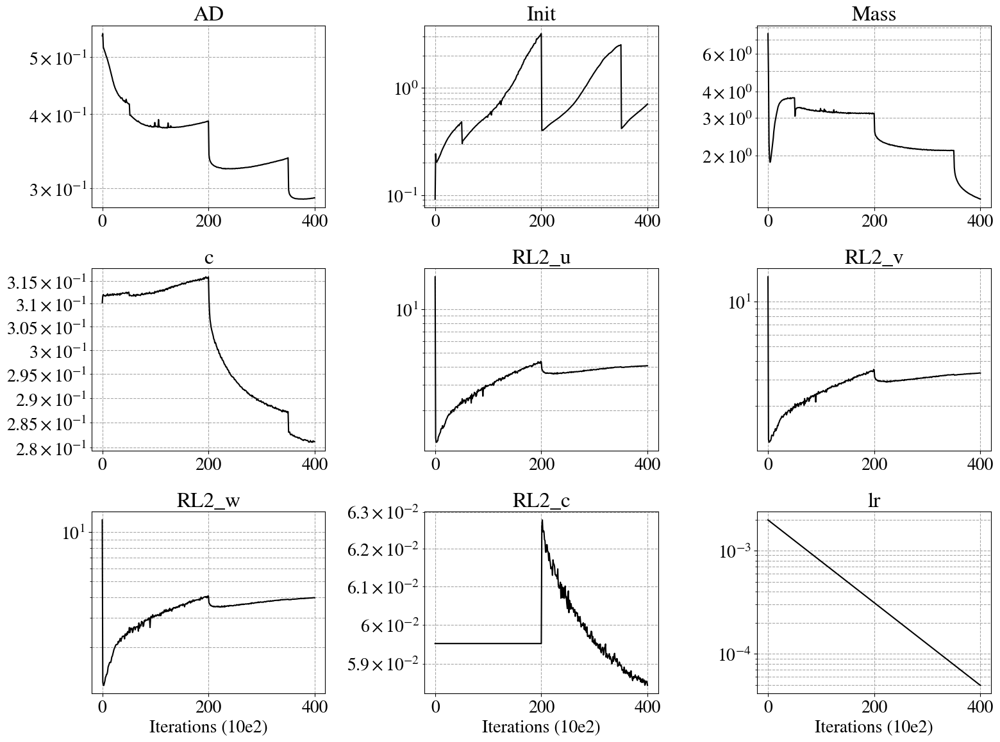

In [55]:
# Call the function
plot_losses_grid(log_loss)
plt.savefig(result_path + f'Losses.png')
plt.show()


# Plots

In [56]:
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
# Further computations for errors if any
u_pred  = vmap(u_fx, (0))(dataset['GT'][:,0:layers_ref[0]])[:,None]
v_pred  = vmap(v_fx, (0))(dataset['GT'][:,0:layers_ref[0]])[:,None]
w_pred  = vmap(w_fx, (0))(dataset['GT'][:,0:layers_ref[0]])[:,None]
p_pred  = vmap(p_fx, (0))(dataset['GT'][:,0:layers_ref[0]])[:,None]
c_pred  = vmap(c_fx, (0))(dataset['GT'][:,0:layers_ref[0]])[:,None]
velocity_magnitude = np.sqrt(u_pred**2 + v_pred**2 + w_pred**2)

RL2_c = relative_error2(c_pred, dataset['GT'][:,4:5])
print(f'Relative L2 errors for c:{RL2_c:.4e}')
u_max, u_min = np.max(u_pred), np.min(u_pred)
v_max, v_min = np.max(v_pred), np.min(v_pred)
w_max, w_min = np.max(w_pred), np.min(w_pred)
p_max, p_min = np.max(p_pred), np.min(p_pred)
c_max, c_min = np.max(c_pred), np.min(c_pred)
vmag_max, vmag_min= np.max(velocity_magnitude), np.min(velocity_magnitude)

Relative L2 errors for c:5.8447e-02


In [57]:
#Arrays
T_star=X_nnf[:,:,0]
X_star=X_nnf[:,:,1]
Y_star=X_nnf[:,:,2]
Z_star=X_nnf[:,:,3]
C_star=X_nnf[:,:,4]

k1=1*10**(-12)#m2W
D1=3.8*10**(-10)#m2/s
k2=1*10**(-16)
D2=2.3*10**(-10)
nu_e=7*10**(-7)
rho=993
h=0.00034 #Maximum length by 100
L_char=h
U_char=0.1#mm/min
D_char=2.4e-10*5#m2/s
U_char=U_char*(1/1000)*(1/60)#m/s
T_char0=np.copy(T_char)
T_char=L_char/U_char
C_char=1/(100/keep_c)
mms=10**3
L_char=L_char*mms
U_char=U_char*mms
print(T_char,L_char,U_char,C_char,D_char)
rec_fact=np.array([[T_char,L_char,L_char,L_char,U_char,U_char,U_char,P_char,C_char]])
print(rec_fact)

204.00000000000003 0.34 0.0016666666666666666 0.01 1.2e-09
[[2.04000000e+02 3.40000000e-01 3.40000000e-01 3.40000000e-01
  1.66666667e-03 1.66666667e-03 1.66666667e-03 3.91736667e+01
  1.00000000e-02]]


  0%|          | 0/86 [00:00<?, ?it/s]

100%|██████████| 86/86 [01:04<00:00,  1.33it/s]


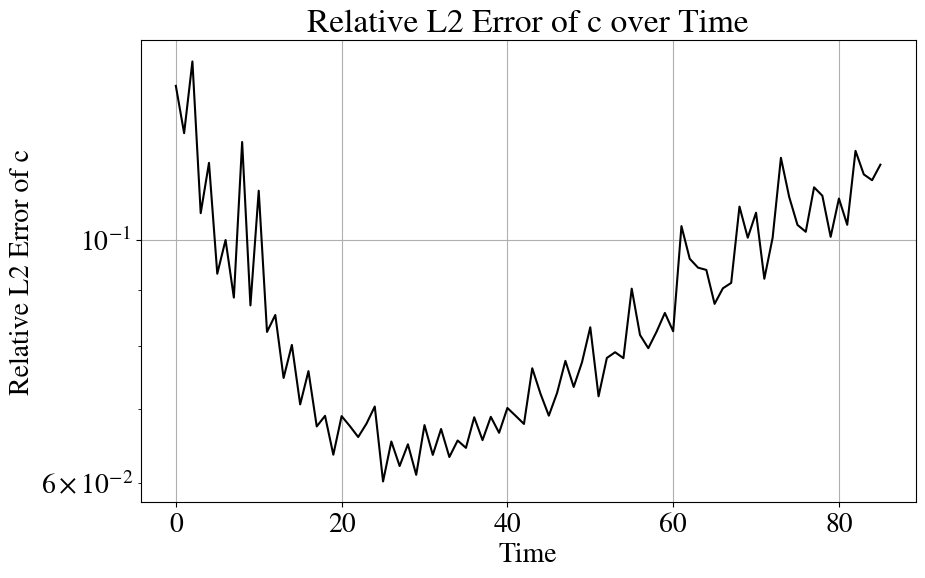

In [58]:
Errors_c=[]
min_vals=[]
max_vals=[]
for t__frame_plot in tqdm.tqdm(range(avoid_from_org,len(T_star))):
    snap = np.array([t__frame_plot])
    t_test = T_star[snap,:].T
    x_test = X_star[snap,:].T
    y_test = Y_star[snap,:].T
    z_test = Z_star[snap,:].T
    c_test = C_star[snap,:].T
    X_test=np.hstack((t_test,x_test,y_test,z_test))
    # Further computations for errors if any
    u_pred  = vmap(u_fx, (0))(X_test[:,0:layers_ref[0]])[:,None]
    v_pred  = vmap(v_fx, (0))(X_test[:,0:layers_ref[0]])[:,None]
    w_pred  = vmap(w_fx, (0))(X_test[:,0:layers_ref[0]])[:,None]
    p_pred  = vmap(p_fx, (0))(X_test[:,0:layers_ref[0]])[:,None]
    c_pred  = vmap(c_fx, (0))(X_test[:,0:layers_ref[0]])[:,None]*C_char
    velocity_magnitude = np.sqrt(u_pred**2 + v_pred**2 + w_pred**2)
    uvwpc_pred   = np.hstack((u_pred,v_pred,w_pred,p_pred,c_pred))
    u_pred, v_pred, w_pred, p_pred,c_pred,  =uvwpc_pred[:,0:1],uvwpc_pred[:,1:2],uvwpc_pred[:,2:3],uvwpc_pred[:,3:4],uvwpc_pred[:,4:5]
    error_c = relative_error(c_pred, c_test)
    data_frame=np.hstack((X_test,u_pred, v_pred, w_pred, p_pred,c_pred))
    data_frame=data_frame*rec_fact
    Errors_c.append(error_c)
    min_vals.append(np.min(uvwpc_pred,axis=0))
    max_vals.append(np.max(uvwpc_pred,axis=0))
plt.figure(figsize=(10, 6))
plt.plot(Errors_c, linestyle='-',color='k')
plt.yscale('log')  # Set logarithmic scale for the y-axis
plt.xlabel('Time')
plt.ylabel('Relative L2 Error of c')
plt.title('Relative L2 Error of c over Time')
plt.grid(True)
plt.show()

In [59]:
print(f'Average RL2 for c over time:{np.mean(Errors_c)}')

Average RL2 for c over time:0.08641506880258955


[-1.3717154e-02 -1.3717154e-02 -5.3326664e+01 -6.3355717e+01
 -5.7746784e+01  4.2398648e+00]
[ 0.8719663  0.8719663 37.766563  41.577415  32.87113   57.269516 ]


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:06<00:00,  6.63s/it]


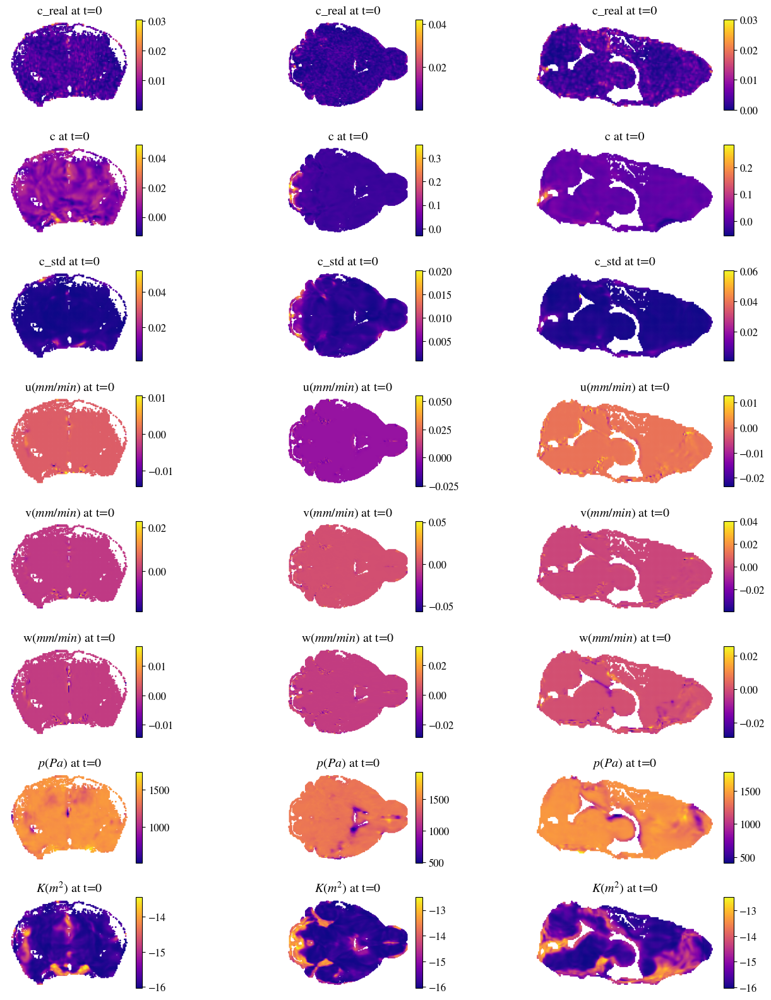

In [60]:
mpl.rcParams['font.size'] = 12
rec_fact=np.array([[T_char,L_char,L_char,L_char]])
plot=0
# Convert lists of min and max values to numpy arrays for easy indexing
min_vals_arr = np.array(min_vals)
min_vals_arr = np.hstack((min_vals_arr[:,4:5],min_vals_arr[:,4:5],min_vals_arr[:,:4]))
max_vals_arr = np.array(max_vals)
max_vals_arr = np.hstack((max_vals_arr[:,4:5],max_vals_arr[:,4:5],max_vals_arr[:,:4]))


# Compute global min and max for each variable across all frames
global_min = min_vals_arr.min(axis=0)
global_max = max_vals_arr.max(axis=0)
print(global_min)
print(global_max)
start=0
end=start+1
#end=len(T_star)
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)

for t__frame_plot in tqdm.tqdm(range(start,end)):
    snap = np.array([t__frame_plot])
    t_test = T_star[snap,:].T
    t_test_k =t_test*0+10
    x_test = X_star[snap,:].T
    y_test = Y_star[snap,:].T
    z_test = Z_star[snap,:].T
    c_test = C_star[snap,:].T
    X_test=np.hstack((t_test,x_test,y_test,z_test))
    X_test_k=np.hstack((t_test_k,x_test,y_test,z_test))

    # Further computations for errors if any
    u_pred  = vmap(u_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*U_char
    v_pred  = vmap(v_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*U_char
    w_pred  = vmap(w_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*U_char
    p_pred  = vmap(p_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*P_char
    p_pred =p_pred-p_pred.min()
    c_pred  = vmap(c_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    c_std_pred  = vmap(c_std_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    K_pred  = vmap(k_fx, (0))(X_test_k[:,0:layers_ref[0]])[:,None]*k_char
    
    
    velocity_magnitude = np.sqrt(u_pred**2 + v_pred**2 + w_pred**2)
    uvwpc_pred   = np.hstack((u_pred,v_pred,w_pred,p_pred,c_pred,c_std_pred,K_pred))
    u_pred, v_pred, w_pred, p_pred, c_pred,c_std_pred,K_pred = uvwpc_pred[:, 0:1], uvwpc_pred[:, 1:2], uvwpc_pred[:, 2:3], uvwpc_pred[:, 3:4] , uvwpc_pred[:, 4:5], uvwpc_pred[:, 5:6], uvwpc_pred[:, 6:7]
    data_frame = np.hstack((X_test*rec_fact, u_pred, v_pred, w_pred, p_pred, c_pred,c_std_pred,K_pred))


    x_midplane = np.median(x_test)
    y_midplane = np.median(y_test)
    z_midplane = np.median(z_test)

    tolerance = 0.05
    x_midplane_filter = np.abs(x_test - x_midplane) <= tolerance
    y_midplane_filter = np.abs(y_test - y_midplane) <= tolerance
    z_midplane_filter = np.abs(z_test - z_midplane) <= tolerance
    if end>start+1:
        variables = [c_test, c_pred]
        variable_names = ['c_real', 'c']
    variables = [c_test, c_pred,c_std_pred, u_pred, v_pred, w_pred, p_pred,np.log10(K_pred)]
    variable_names = ['c_real', 'c','c_std' ,'u($mm/min$)', 'v($mm/min$)', 'w($mm/min$)', '$p(Pa)$','$K(m^2)$']
    name_image = images_path + f'time:{t__frame_plot / len(T_star):.4f}.png'
    fig = plt.figure(figsize=(14, 2 * len(variables)))

    for i, var in enumerate(variables):
        for j in range(3):
            ax = fig.add_subplot(len(variables), 3, i * 3 + j + 1)
            if j == 0:
                filter = x_midplane_filter
                x, y = z_test, y_test
                xlabel, ylabel = 'Y', 'Z'
            elif j == 1:
                filter = y_midplane_filter
                x, y = x_test, z_test
                xlabel, ylabel = 'X', 'Z'
            else:
                filter = z_midplane_filter
                x, y = x_test, y_test
                xlabel, ylabel = 'X', 'Y'

            #vmin, vmax = global_min[i], global_max[i]  # Use the global min/max values for each variable
            scatter = ax.scatter(x[filter], y[filter], c=var[filter], cmap=cmap, s=1)#], vmin=vmin, vmax=vmax)
            ax.set_title(f'{variable_names[i]} at t={t__frame_plot}')
            ax.set_xlabel(xlabel)
            ax.set_ylabel(ylabel)
            ax.axis('equal')
            ax.axis('off')

            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(scatter, cax=cax)

    plt.tight_layout()
    plt.savefig('Steady_high')
    if end>start+1:
        plt.close()


In [61]:
data_frame = np.hstack((X_test*rec_fact, u_pred, v_pred, w_pred, p_pred, c_pred,c_std_pred,K_pred))
print(data_frame.shape)
np.savetxt('steady_fields_high.txt', data_frame, delimiter=' ', header='t_s x y z_mm u_mm_s v_mm_s w_mm_s P_Pa K_m2')


(464230, 11)


In [62]:
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
# Further computations for errors if any
c_pred  = vmap(c_fx, (0))(dataset['GT'][:,0:layers_ref[0]])[:,None]
c_test  =dataset['GT'][:,4:5]
RL2_c = relative_error2(c_pred, c_test)
print(f'Relative L2 errors for c:{RL2_c:.4e}')
name=dataset_name+'steady_fields_high.mat'
Data_save={
    'txyz_smm':X_test*rec_fact,
    'u_mm_s':u_pred,
    'v_mm_s':v_pred,
    'w_mm_s':w_pred,
    'P_Pa':p_pred,
    'K_m2':K_pred,
    'c_pred':c_pred,
    'c_test':c_test,
    'Errors_c':Errors_c,
}
scipy.io.savemat(name,Data_save)

Relative L2 errors for c:5.8447e-02


In [63]:
mpl.rcParams['font.size'] = 12
rec_fact=np.array([[T_char,L_char,L_char,L_char]])
plot=0
# Convert lists of min and max values to numpy arrays for easy indexing
min_vals_arr = np.array(min_vals)
min_vals_arr = np.hstack((min_vals_arr[:,4:5],min_vals_arr[:,4:5],min_vals_arr[:,:4]))
max_vals_arr = np.array(max_vals)
max_vals_arr = np.hstack((max_vals_arr[:,4:5],max_vals_arr[:,4:5],max_vals_arr[:,:4]))


# Compute global min and max for each variable across all frames
global_min = min_vals_arr.min(axis=0)
global_max = max_vals_arr.max(axis=0)
print(global_min)
print(global_max)
plot_all=True
start=0
end=start+1
end=len(T_star)
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
all_results=[]
for t__frame_plot in tqdm.tqdm(range(start,end)):
    snap = np.array([t__frame_plot])
    t_test = T_star[snap,:].T
    t_test_k =t_test*0+10
    x_test = X_star[snap,:].T
    y_test = Y_star[snap,:].T
    z_test = Z_star[snap,:].T
    c_test = C_star[snap,:].T
    X_test=np.hstack((t_test,x_test,y_test,z_test))
    X_test_k=np.hstack((t_test_k,x_test,y_test,z_test))

    # Further computations for errors if any
    c_pred  = vmap(c_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    c_std_pred  = vmap(c_std_fx, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    

    uvwpc_pred   = np.hstack((c_pred,c_std_pred))
    c_pred,c_std_pred = uvwpc_pred[:, 0:1], uvwpc_pred[:, 1:2]
    data_frame = np.hstack((X_test*rec_fact,c_test, c_pred,c_std_pred))
    all_results.append(data_frame)

    x_midplane = np.median(x_test)
    y_midplane = np.median(y_test)
    z_midplane = np.median(z_test)

    tolerance = 0.05
    x_midplane_filter = np.abs(x_test - x_midplane) <= tolerance
    y_midplane_filter = np.abs(y_test - y_midplane) <= tolerance
    z_midplane_filter = np.abs(z_test - z_midplane) <= tolerance
    variables = [c_test, c_pred,c_std_pred]
    variable_names = ['c_real', 'c','c_std']
    name_image = Video_path + f'C_time:{t__frame_plot / len(T_star):.4f}.png'
    if plot_all:
        fig = plt.figure(figsize=(14, 2 * len(variables)))

        for i, var in enumerate(variables):
            for j in range(3):
                ax = fig.add_subplot(len(variables), 3, i * 3 + j + 1)
                if j == 0:
                    filter = x_midplane_filter
                    x, y = z_test, y_test
                    xlabel, ylabel = 'Y', 'Z'
                elif j == 1:
                    filter = y_midplane_filter
                    x, y = x_test, z_test
                    xlabel, ylabel = 'X', 'Z'
                else:
                    filter = z_midplane_filter
                    x, y = x_test, y_test
                    xlabel, ylabel = 'X', 'Y'

                #vmin, vmax = global_min[i], global_max[i]  # Use the global min/max values for each variable
                scatter = ax.scatter(x[filter], y[filter], c=var[filter], cmap=cmap, s=1)#], vmin=vmin, vmax=vmax)
                ax.set_title(f'{variable_names[i]} at t={t__frame_plot}')
                ax.set_xlabel(xlabel)
                ax.set_ylabel(ylabel)
                ax.axis('equal')
                ax.axis('off')

                divider = make_axes_locatable(ax)
                cax = divider.append_axes("right", size="5%", pad=0.05)
                plt.colorbar(scatter, cax=cax)

        plt.tight_layout()
        plt.savefig(name_image)
        if end>start+1:
            plt.close()


[-1.3717154e-02 -1.3717154e-02 -5.3326664e+01 -6.3355717e+01
 -5.7746784e+01  4.2398648e+00]
[ 0.8719663  0.8719663 37.766563  41.577415  32.87113   57.269516 ]


  0%|          | 0/90 [00:00<?, ?it/s]

100%|██████████| 90/90 [03:20<00:00,  2.22s/it]


In [64]:
Video_name=args.Name+'.mp4'
make_video(Video_path,Video_name,fps=10)

100%|██████████| 90/90 [00:01<00:00, 48.71it/s]


In [65]:
name='unsteady_fields_high.mat'
Data_save={
    'Data':all_results,
    'Variables':['t_s','xyz_mm','c_real','c_pred','c_std']
}
scipy.io.savemat(name,Data_save)

# Extract Gradients

In [66]:
mpl.rcParams['font.size'] = 12
rec_fact=np.array([[T_char,L_char,L_char,L_char]])
plot=0
# Convert lists of min and max values to numpy arrays for easy indexing
min_vals_arr = np.array(min_vals)
min_vals_arr = np.hstack((min_vals_arr[:,4:5],min_vals_arr[:,4:5],min_vals_arr[:,:4]))
max_vals_arr = np.array(max_vals)
max_vals_arr = np.hstack((max_vals_arr[:,4:5],max_vals_arr[:,4:5],max_vals_arr[:,:4]))


# Compute global min and max for each variable across all frames
global_min = min_vals_arr.min(axis=0)
global_max = max_vals_arr.max(axis=0)
print(global_min)
print(global_max)
plot_all=False
start=0
end=start+1
end=len(T_star)
c_x, c_y,c_z,c_xx,c_yy,c_zz  = gradients_c(params)
all_results=[]
for t__frame_plot in tqdm.tqdm(range(start,end)):
    snap = np.array([t__frame_plot])
    t_test = T_star[snap,:].T
    x_test = X_star[snap,:].T
    y_test = Y_star[snap,:].T
    z_test = Z_star[snap,:].T
    X_test=np.hstack((t_test,x_test,y_test,z_test))

    # Further computations for errors if any
    c_pred_x  = vmap(c_x, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    c_pred_y  = vmap(c_y, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    c_pred_z  = vmap(c_z, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    c_pred_xx  = vmap(c_xx, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    c_pred_yy  = vmap(c_yy, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char
    c_pred_zz  = vmap(c_zz, (0))(X_test[:,0:layers_1[0]])[:,None]*C_char

    uvwpc_pred   = np.hstack((c_pred_x,c_pred_y,c_pred_z,c_pred_xx,c_pred_yy,c_pred_zz))
    data_frame = np.hstack((X_test*rec_fact,uvwpc_pred))
    all_results.append(data_frame)

    x_midplane = np.median(x_test)
    y_midplane = np.median(y_test)
    z_midplane = np.median(z_test)

    tolerance = 0.05
    x_midplane_filter = np.abs(x_test - x_midplane) <= tolerance
    y_midplane_filter = np.abs(y_test - y_midplane) <= tolerance
    z_midplane_filter = np.abs(z_test - z_midplane) <= tolerance
    variables = [c_pred_x, c_pred_y,c_pred_z,c_pred_xx,c_pred_yy,c_pred_zz]
    variable_names = ['c_x', 'c_y','c_z','c_xx', 'c_yy','c_zz']
    name_image = f'gradients_time:{t__frame_plot / len(T_star):.4f}.png'
    if plot_all:
        fig = plt.figure(figsize=(14, 2 * len(variables)))

        for i, var in enumerate(variables):
            for j in range(3):
                ax = fig.add_subplot(len(variables), 3, i * 3 + j + 1)
                if j == 0:
                    filter = x_midplane_filter
                    x, y = z_test, y_test
                    xlabel, ylabel = 'Y', 'Z'
                elif j == 1:
                    filter = y_midplane_filter
                    x, y = x_test, z_test
                    xlabel, ylabel = 'X', 'Z'
                else:
                    filter = z_midplane_filter
                    x, y = x_test, y_test
                    xlabel, ylabel = 'X', 'Y'

                #vmin, vmax = global_min[i], global_max[i]  # Use the global min/max values for each variable
                scatter = ax.scatter(x[filter], y[filter], c=var[filter], cmap=cmap, s=1)#], vmin=vmin, vmax=vmax)
                ax.set_title(f'{variable_names[i]} at t={t__frame_plot}')
                ax.set_xlabel(xlabel)
                ax.set_ylabel(ylabel)
                ax.axis('equal')
                ax.axis('off')

                divider = make_axes_locatable(ax)
                cax = divider.append_axes("right", size="5%", pad=0.05)
                plt.colorbar(scatter, cax=cax)

        plt.tight_layout()
        plt.savefig(name_image)
        if end>start+1:
            plt.close()


[-1.3717154e-02 -1.3717154e-02 -5.3326664e+01 -6.3355717e+01
 -5.7746784e+01  4.2398648e+00]
[ 0.8719663  0.8719663 37.766563  41.577415  32.87113   57.269516 ]


 23%|██▎       | 21/90 [00:32<01:51,  1.62s/it]

100%|██████████| 90/90 [02:30<00:00,  1.67s/it]


In [67]:
name='Concentration_gradients.mat'
Data_save={
    'Data':all_results,
    'Variables':['t_s','xyz_mm','c_x','c_y','c_z','c_xx','c_yy','c_zz']
}
scipy.io.savemat(name,Data_save)

# Validate Model

In [68]:
dataset['Test_crop']=X_init_clean

In [69]:
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
# Further computations for errors if any
u_pred  = vmap(u_fx, (0))(dataset['Test_crop'][:,0:layers_1[0]])[:,None]*U_char
v_pred  = vmap(v_fx, (0))(dataset['Test_crop'][:,0:layers_1[0]])[:,None]*U_char
w_pred  = vmap(w_fx, (0))(dataset['Test_crop'][:,0:layers_1[0]])[:,None]*U_char
p_pred  = vmap(p_fx, (0))(dataset['Test_crop'][:,0:layers_1[0]])[:,None]*p_scale*P_char
p_pred  =p_pred-p_pred.min()
c_pred  = vmap(c_fx, (0))(dataset['Test_crop'][:,0:layers_1[0]])[:,None]

velocity_magnitude = np.sqrt(u_pred**2 + v_pred**2 + w_pred**2)

RL2_u = relative_error2(u_pred, dataset['Test_crop'][:,4:5]*U_char)
RL2_v = relative_error2(v_pred, dataset['Test_crop'][:,5:6]*U_char)
RL2_w = relative_error2(w_pred, dataset['Test_crop'][:,6:7]*U_char)

u_max, u_min = np.max(u_pred), np.min(u_pred)
v_max, v_min = np.max(v_pred), np.min(v_pred)
w_max, w_min = np.max(w_pred), np.min(w_pred)
p_max, p_min = np.max(p_pred), np.min(p_pred)
c_max, c_min = np.max(c_pred), np.min(c_pred)
vmag_max, vmag_min= np.max(velocity_magnitude), np.min(velocity_magnitude)
x_test = dataset['Test_crop'][:,1:2]
y_test = dataset['Test_crop'][:,2:3]
z_test = dataset['Test_crop'][:,3:4]
u_test = dataset['Test_crop'][:,4:5]*U_char  
v_test = dataset['Test_crop'][:,5:6]*U_char  
w_test = dataset['Test_crop'][:,6:7]*U_char 
# p_test = dataset['Test_crop'][:,7:8]*P_char
# p_test  =p_test-p_test.min()
# RL2_p = relative_error2(p_pred, p_test)
print(f'Relative L2 errors for u:{RL2_u:.4e} v:{RL2_v:.4e} w:{RL2_w:.4e}')# p:{RL2_p:.4e}')

V_test = np.sqrt(u_test**2 + v_test**2 + w_test**2)
V_pred = np.sqrt(u_pred**2 + v_pred**2 + w_pred**2)

Relative L2 errors for u:4.0573e+00 v:3.3205e+00 w:3.9890e+00


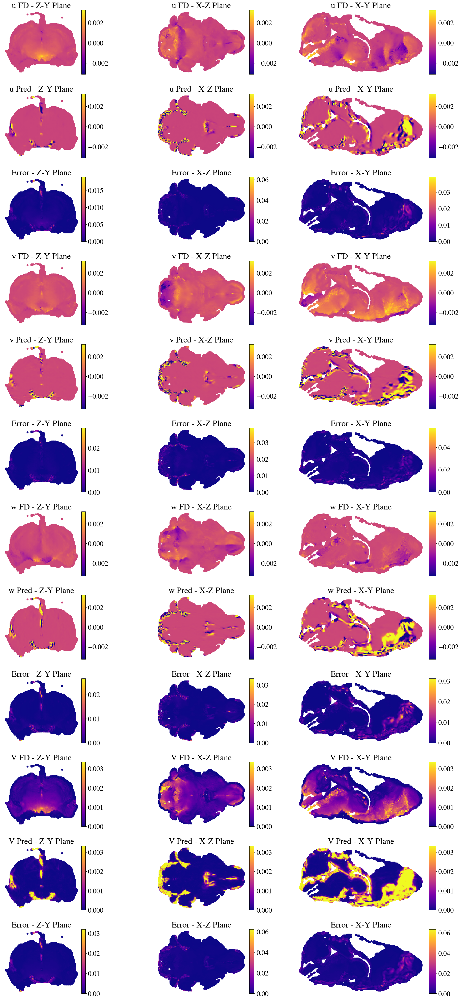

In [70]:

mpl.rcParams['font.size'] = 20
size_point=20

# Calculate midplane values
x_mid = np.median(x_test)
y_mid = np.median(y_test)
z_mid = np.median(z_test)

# Define tolerance for midplane filtering
tolerance = 0.5

# Create filters for midplane slices
x_filter = np.abs(x_test - x_mid) <= tolerance
y_filter = np.abs(y_test - y_mid) <= tolerance
z_filter = np.abs(z_test - z_mid) <= tolerance

# Prepare the data for plotting
data_pairs = [
    (u_test, u_pred, 'u FD', 'u Pred'),
    (v_test, v_pred, 'v FD', 'v Pred'),
    (w_test, w_pred, 'w FD', 'w Pred'),
    #(p_test, p_pred, 'p FD', 'p Pred'),
    (V_test, V_pred, 'V FD', 'V Pred')
]

# Define colormap
cmap = plt.get_cmap('plasma')

# Start plotting
fig, axes = plt.subplots(nrows=12, ncols=3, figsize=(20, 40))#, constrained_layout=True)  # Adjusted for additional rows for error plots

for i, (test_data, pred_data, test_label, pred_label) in enumerate(data_pairs):
    # Compute global vmin and vmax for each pair from the test data
    vmin = np.min(test_data)
    vmax = np.max(test_data)
    error_data = np.abs(test_data - pred_data)  # Calculate absolute error

    for j in range(3):
        if j == 0:  # X Midplane: Plot Y vs Z
            x, y = z_test, y_test
            xlabel, ylabel = 'Z', 'Y'
            filter = x_filter
        elif j == 1:  # Y Midplane: Plot X vs Z
            x, y = x_test, z_test
            xlabel, ylabel = 'X', 'Z'
            filter = y_filter
        else:  # Z Midplane: Plot X vs Y
            x, y = x_test, y_test
            xlabel, ylabel = 'X', 'Y'
            filter = z_filter

        # Index calculation for subplot
        ax_test = axes[i*3, j]
        ax_pred = axes[i*3+1, j]
        ax_error = axes[i*3+2, j]  # Additional axis for error

        # Plot test data
        sc_test = ax_test.scatter(x[filter], y[filter], c=test_data[filter], cmap=cmap, vmin=vmin, vmax=vmax,s=size_point)
        ax_test.set_title(f'{test_label} - {xlabel}-{ylabel} Plane')
        ax_test.set_xlabel(xlabel)
        ax_test.set_ylabel(ylabel)
        ax_test.axis('equal')
        ax_test.axis('off')
        divider = make_axes_locatable(ax_test)
        cax_test = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(sc_test, cax=cax_test)

        # Plot predicted data
        sc_pred = ax_pred.scatter(x[filter], y[filter], c=pred_data[filter], cmap=cmap, vmin=vmin, vmax=vmax,s=size_point)
        ax_pred.set_title(f'{pred_label} - {xlabel}-{ylabel} Plane')
        ax_pred.set_xlabel(xlabel)
        ax_pred.set_ylabel(ylabel)
        ax_pred.axis('equal')
        ax_pred.axis('off')
        divider = make_axes_locatable(ax_pred)
        cax_pred = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(sc_pred, cax=cax_pred)

        # Plot error data
        sc_error = ax_error.scatter(x[filter], y[filter], c=error_data[filter], cmap=cmap, vmin=0,s=size_point)#, vmax=vmax-vmin)
        ax_error.set_title(f'Error - {xlabel}-{ylabel} Plane')
        ax_error.set_xlabel(xlabel)
        ax_error.set_ylabel(ylabel)
        ax_error.axis('equal')
        ax_error.axis('off')
        divider = make_axes_locatable(ax_error)
        cax_error = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(sc_error, cax=cax_error)
plt.tight_layout()
plt.show()

# Save or show the figure


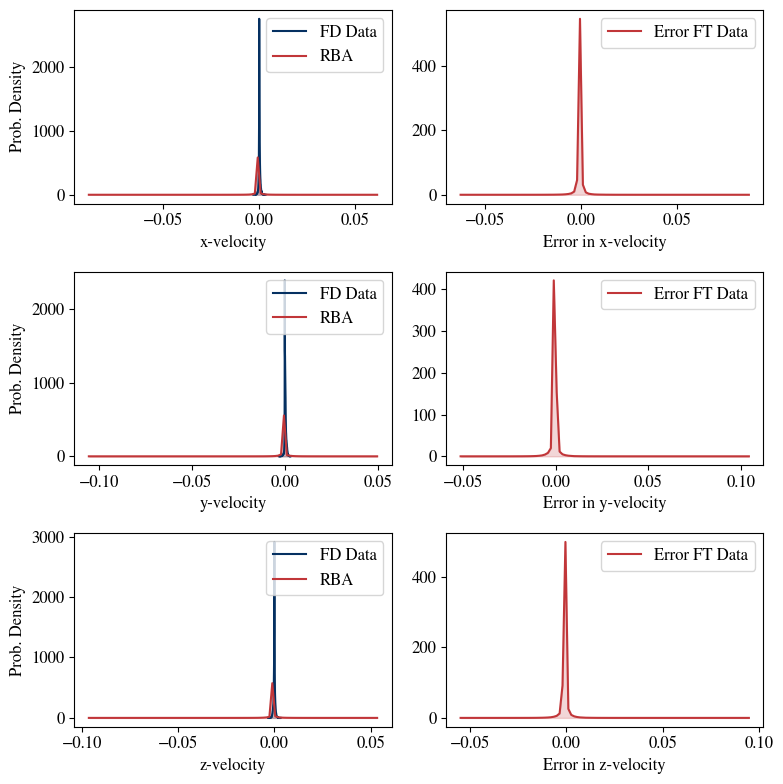

In [71]:

def get_pdf(u_hist, bins=30):
    hist, bins = np.histogram(u_hist, bins=bins, density=True)
    prob_density = hist
    return prob_density, bins
def get_colors_plot(cmap='RdBu', n_colors=2):
    
    cmap = plt.get_cmap(cmap)
    colors = [cmap(i) for i in np.linspace(0, 1, n_colors)]
    return colors
def plot_pdf_fields_with_error(datasets, field_names, colors, bins=100, figsize=(8, 8)):
    num_fields = len(datasets)
    fig, axs = plt.subplots(num_fields, 2, figsize=figsize)  # 3 columns for data, RBA, and error

    for i, ((data_piv, data_aiv), field_name) in enumerate(zip(datasets, field_names)):
        prob_density_piv, bins_piv = get_pdf(data_piv, bins=bins)
        prob_density_aiv, bins_aiv = get_pdf(data_aiv, bins=bins)
        error = data_piv - data_aiv
        prob_density_error, bins_error = get_pdf(error, bins=bins)

        # Plotting data
        axs[i, 0].plot(bins_piv[:-1], prob_density_piv, color=colors[0], label=f'FD Data')
        axs[i, 0].fill_between(bins_piv[:-1], prob_density_piv, color=colors[0], alpha=0.2)
        axs[i, 0].set_xlabel(f'{field_name}')
        axs[i, 0].plot(bins_aiv[:-1], prob_density_aiv, color=colors[-2], label='RBA')
        axs[i, 0].fill_between(bins_aiv[:-1], prob_density_aiv, color=colors[-2], alpha=0.2)
        axs[i, 0].set_xlabel(f'{field_name}')
        axs[i, 0].set_ylabel('Prob. Density')
        axs[i, 0].legend(loc='upper right')
        #axs[i, 0].set_yscale('log')  # Apply log scale to the y-axis

        # Plotting error
        axs[i, 1].plot(bins_error[:-1], prob_density_error, color=colors[-2], label='Error FT Data')
        axs[i, 1].fill_between(bins_error[:-1], prob_density_error, color=colors[-2], alpha=0.2)
        axs[i, 1].set_xlabel(f'Error in {field_name}')
        axs[i, 1].legend(loc='upper right')
        #axs[i, 1].set_yscale('log')  # Apply log scale to the y-axis

    plt.tight_layout()
    return fig


# Extracting and reshaping data
u_piv_hist = np.array(jax.device_get(dataset['Test_crop'][:,4:5])*U_char).reshape(-1)
u_aiv_hist = np.array(jax.device_get(u_pred)).reshape(-1)
v_piv_hist = np.array(jax.device_get(dataset['Test_crop'][:,5:6])*U_char).reshape(-1)
v_aiv_hist = np.array(jax.device_get(v_pred)).reshape(-1)
w_piv_hist = np.array(jax.device_get(dataset['Test_crop'][:,6:7])*U_char).reshape(-1)
w_aiv_hist = np.array(jax.device_get(w_pred)).reshape(-1)  # Assuming w_pred is defined

bins = 40

# Calculating probability densities
prob_density_u_piv, bins_u_piv = get_pdf(u_piv_hist, bins=bins)
prob_density_u_aiv, bins_u_aiv = get_pdf(u_aiv_hist, bins=bins)
prob_density_v_piv, bins_v_piv = get_pdf(v_piv_hist, bins=bins)
prob_density_v_aiv, bins_v_aiv = get_pdf(v_aiv_hist, bins=bins)
prob_density_w_piv, bins_w_piv = get_pdf(w_piv_hist, bins=bins)
prob_density_w_aiv, bins_w_aiv = get_pdf(w_aiv_hist, bins=bins)


colors = get_colors_plot(cmap='RdBu_r', n_colors=8)
datasets = [(u_piv_hist, u_aiv_hist), (v_piv_hist, v_aiv_hist), 
            (w_piv_hist, w_aiv_hist)]
field_names = ['x-velocity', 'y-velocity', 'z-velocity', 'T']
mpl.rcParams['font.size'] = 12

fig = plot_pdf_fields_with_error(datasets, field_names, colors)

plt.savefig(result_path + '/AIV-Prob_dist_epochs.png')
plt.show()



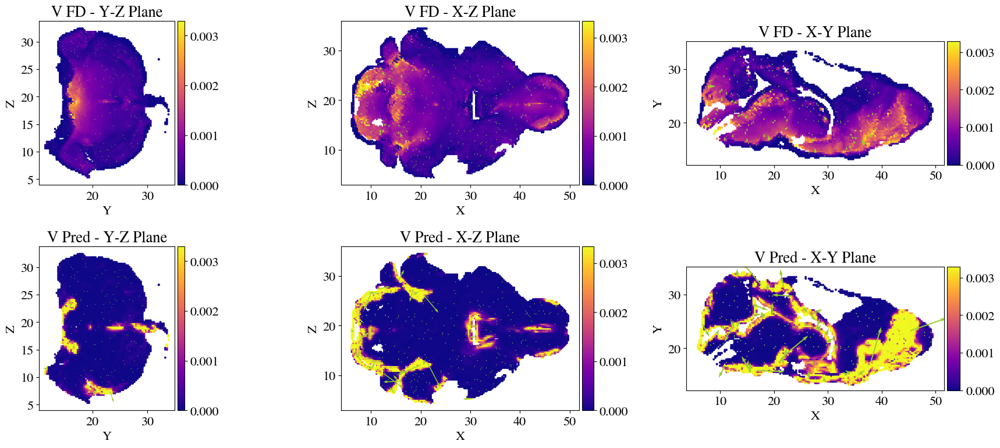

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming the setup for x_test, y_test, z_test, u_test, v_test, w_test, u_pred, v_pred, w_pred, and the data_pairs list
mpl.rcParams['font.size'] = 16

# Define colormap
cmap = plt.get_cmap('plasma')

# Start plotting with adjusted figsize for just the last two rows
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 8))

# Assuming you are working with the last pair in data_pairs
test_data, pred_data, test_label, pred_label = data_pairs[-1]

for j in range(3):
    ax_test = axes[0, j]  # First row for test data
    ax_pred = axes[1, j]  # Second row for predicted data
    
    # Determine which midplane we are plotting
    if j == 0:  # X Midplane: Plot Y vs Z
        x, y = y_test, z_test
        xlabel, ylabel = 'Y', 'Z'
        filter = x_filter
        u, v = v_test, w_test
        u_pred_sub, v_pred_sub = v_pred, w_pred
    elif j == 1:  # Y Midplane: Plot X vs Z
        x, y = x_test, z_test
        xlabel, ylabel = 'X', 'Z'
        filter = y_filter
        u, v = u_test, w_test
        u_pred_sub, v_pred_sub = u_pred, w_pred
    else:  # Z Midplane: Plot X vs Y
        x, y = x_test, y_test
        xlabel, ylabel = 'X', 'Y'
        filter = z_filter
        u, v = u_test, v_test
        u_pred_sub, v_pred_sub = u_pred, v_pred

    # Sampling 10% of the data for vector plotting
    indices = np.random.choice(np.where(filter)[0], len(x[filter]) // 100, replace=False)

    # Plot test data and vectors
    sc_test = ax_test.scatter(x[filter], y[filter], c=test_data[filter], cmap=cmap,vmin=np.min(test_data[filter]),vmax=np.max(test_data[filter]),  s=3)
    ax_test.quiver(x[indices], y[indices], u[indices], v[indices], color='yellowgreen', scale=0.1)
    ax_test.set_title(f'{test_label} - {xlabel}-{ylabel} Plane')
    ax_test.set_xlabel(xlabel)
    ax_test.set_ylabel(ylabel)
    ax_test.axis('equal')

    # Plot predicted data and vectors
    sc_pred = ax_pred.scatter(x[filter], y[filter], c=pred_data[filter], cmap=cmap,vmin=np.min(test_data[filter]),vmax=np.max(test_data[filter]),  s=3)
    ax_pred.quiver(x[indices], y[indices], u_pred_sub[indices], v_pred_sub[indices], color='yellowgreen', scale=0.1)
    ax_pred.set_title(f'{pred_label} - {xlabel}-{ylabel} Plane')
    ax_pred.set_xlabel(xlabel)
    ax_pred.set_ylabel(ylabel)
    ax_pred.axis('equal')

    # Adding colorbars to both test and predicted plots
    for ax, sc in [(ax_test, sc_test), (ax_pred, sc_pred)]:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(sc, cax=cax)

# Adjust layout
#$plt.tight_layout()

# Save or show the figure
plt.tight_layout()
plt.savefig(result_path + 'Final_midplane_comparison_with_velocity_magnitude.png')
plt.show()


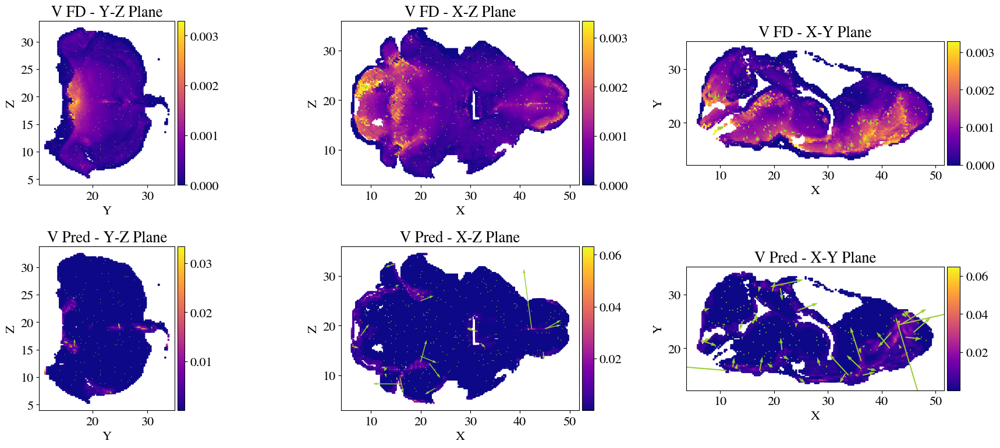

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming the setup for x_test, y_test, z_test, u_test, v_test, w_test, u_pred, v_pred, w_pred, and the data_pairs list
mpl.rcParams['font.size'] = 16

# Define colormap
cmap = plt.get_cmap('plasma')

# Start plotting with adjusted figsize for just the last two rows
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 8))

# Assuming you are working with the last pair in data_pairs
test_data, pred_data, test_label, pred_label = data_pairs[-1]

for j in range(3):
    ax_test = axes[0, j]  # First row for test data
    ax_pred = axes[1, j]  # Second row for predicted data
    
    # Determine which midplane we are plotting
    if j == 0:  # X Midplane: Plot Y vs Z
        x, y = y_test, z_test
        xlabel, ylabel = 'Y', 'Z'
        filter = x_filter
        u, v = v_test, w_test
        u_pred_sub, v_pred_sub = v_pred, w_pred
    elif j == 1:  # Y Midplane: Plot X vs Z
        x, y = x_test, z_test
        xlabel, ylabel = 'X', 'Z'
        filter = y_filter
        u, v = u_test, w_test
        u_pred_sub, v_pred_sub = u_pred, w_pred
    else:  # Z Midplane: Plot X vs Y
        x, y = x_test, y_test
        xlabel, ylabel = 'X', 'Y'
        filter = z_filter
        u, v = u_test, v_test
        u_pred_sub, v_pred_sub = u_pred, v_pred

    # Sampling 10% of the data for vector plotting
    indices = np.random.choice(np.where(filter)[0], len(x[filter]) // 100, replace=False)

    # Plot test data and vectors
    sc_test = ax_test.scatter(x[filter], y[filter], c=test_data[filter], cmap=cmap,  s=3)
    ax_test.quiver(x[indices], y[indices], u[indices], v[indices], color='yellowgreen', scale=0.1)
    ax_test.set_title(f'{test_label} - {xlabel}-{ylabel} Plane')
    ax_test.set_xlabel(xlabel)
    ax_test.set_ylabel(ylabel)
    ax_test.axis('equal')

    # Plot predicted data and vectors
    sc_pred = ax_pred.scatter(x[filter], y[filter], c=pred_data[filter], cmap=cmap,  s=3)
    ax_pred.quiver(x[indices], y[indices], u_pred_sub[indices], v_pred_sub[indices], color='yellowgreen', scale=0.1)
    ax_pred.set_title(f'{pred_label} - {xlabel}-{ylabel} Plane')
    ax_pred.set_xlabel(xlabel)
    ax_pred.set_ylabel(ylabel)
    ax_pred.axis('equal')

    # Adding colorbars to both test and predicted plots
    for ax, sc in [(ax_test, sc_test), (ax_pred, sc_pred)]:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(sc, cax=cax)

# Adjust layout
#$plt.tight_layout()

# Save or show the figure
plt.tight_layout()
plt.savefig(result_path + 'Final_midplane_comparison_with_velocity_magnitude.png')
plt.show()


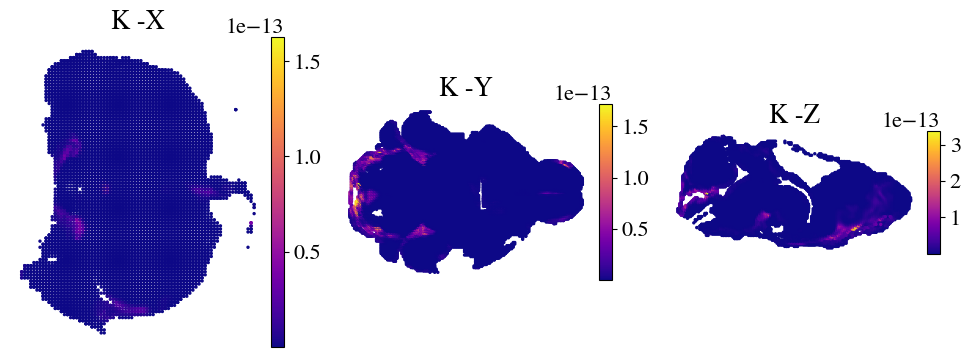

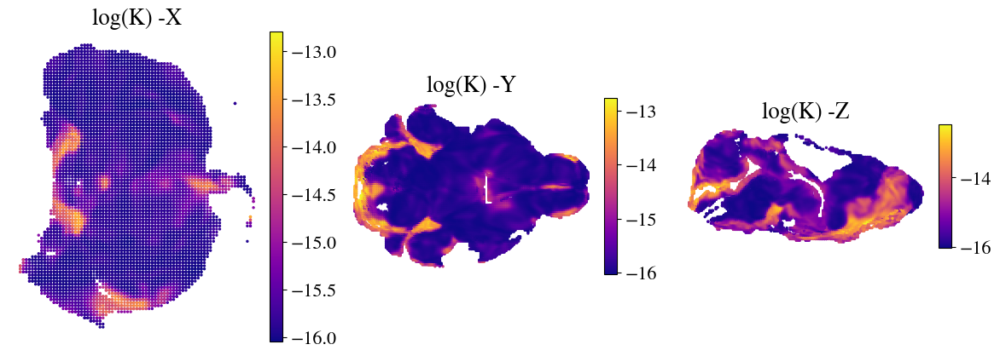

In [74]:
key='Permeability'
Dataset2={}
Dataset2['Permeability']=X_init_clean
u_fx,v_fx,w_fx,p_fx,c_fx,D_fx,k_fx,c_std_fx  = u_model(params)
# Further computations for errors if any
K_pred  = vmap(k_fx, (0))(Dataset2[key][:,0:layers_ref[0]])[:,None]*k_char

t,x, y, z= Dataset2[key][:,0], Dataset2[key][:,1], Dataset2[key][:,2], Dataset2[key][:,3]
# Calculate midplane values
x_midplane = np.median(x)
y_midplane = np.median(y)
z_midplane = np.median(z)

tolerance = 0.3  # Adjust based on your dataset's spread

# Define filters for each midplane
x_midplane_filter = np.abs(x - x_midplane) <= tolerance
y_midplane_filter = np.abs(y - y_midplane) <= tolerance
z_midplane_filter = np.abs(z - z_midplane) <= tolerance

# Prepare for visualization

# Variables for plotting
variables = [K_pred,np.log10(K_pred)]  # Use the scalar field for coloring
variable_names = ['K','log(K)']

# Visualization
for i, var in enumerate(variables):
    fig = plt.figure(figsize=(12, 8))  # Adjust size as needed

    for j in range(3):
        ax = fig.add_subplot(1, 3, j + 1)
        if j == 0:
            filter_mask = x_midplane_filter
            scatter_x, scatter_y = y[filter_mask], z[filter_mask]
            xlabel, ylabel = 'Y', 'Z'
        elif j == 1:
            filter_mask = y_midplane_filter
            scatter_x, scatter_y = x[filter_mask], z[filter_mask]
            xlabel, ylabel = 'X', 'Z'
        else:  # j == 2
            filter_mask = z_midplane_filter
            scatter_x, scatter_y = x[filter_mask], y[filter_mask]
            xlabel, ylabel = 'X', 'Y' 

        # Use the scalar field for coloring
        scatter = ax.scatter(scatter_x, scatter_y, c=var[filter_mask], cmap=cmap, s=2)
        ax.set_title(f'{variable_names[i]} -{["X", "Y", "Z"][j]}')
        #ax.set_xlabel(xlabel)
        #ax.set_ylabel(ylabel)
        ax.axis('equal')
        ax.axis('off')  # Change to 'off' if you prefer no axis

        # Adding a colorbar to each subplot
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(scatter, cax=cax)

plt.tight_layout()
plt.savefig(images_path+'Final_results.png')
plt.show()


In [75]:
Dataset2[key][:,0:layers_ref[0]].min(0)

array([10.        ,  5.58823522, 11.17647045,  4.41176471])

In [76]:
Dataset2[key][:,0:layers_ref[0]].max(0)

array([10.        , 50.        , 34.11764818, 34.41176414])

In [77]:
Dataset2[key][:,0:layers_ref[0]].shape

(379112, 4)